# Housing Data in NYC by Airbnb(2019)

**Names**: Jiaqi Wu, Jiaxin Wu,Kehuan Wang


## 1. Introduction


The listing information on online short-term rental platforms like Airbnb is complex and diverse, primarily due to differences in geographical location, pricing strategies, and market demand. Understanding the intrinsic clustering structure of these listings can improve efficiency in business applications, as these clusters can reveal different market segments, such as listings managed by professional agencies, listings in high-demand areas, or listings primarily used for long-term rentals. It can also identify potential user groups, rather than being limited to data analysis at the listing level. For example, renters can use the clustering results to find cost-effective listings, while landlords can compare their pricing against the clustering results to determine if their pricing is reasonable.

Clustering-based analysis methods are effective and robust because they do not require predefined labels and can reveal non-linear structures in high-dimensional data. However, clustering algorithms do not guarantee the identification of all true intrinsic clusters in a dataset. Some clusters may overlap in the feature space or exist at different densities, making it difficult to detect them simultaneously. Furthermore, algorithms may incorrectly split an intrinsic cluster into multiple spurious clusters, thus misleading market segmentation. For example, a group of geographically adjacent listings might be split due to minor differences in price or activity level. To mitigate these risks, we compared multiple clustering methods and carefully examined the clustering results, including hard partitioning, noise assignment, and soft membership measures.

This report first describes the dataset and preprocessing steps, including handling missing values, outlier treatment, and scaling decisions. Then, we explore the clusterability of the data using dimensionality reduction techniques, followed by applying three clustering algorithms (K-Means, HDBSCAN, DBSCAN) and performing parameter tuning. Finally, we analyze and interpret the resulting clusters using visualization and statistical summaries, and discuss the advantages and limitations of the clustering results.

## 2. Dataset Discussion

In [ ]:
# import library
import sys
!{sys.executable} -m pip install geopandas
import geopandas as gpd
import hdbscan
import numpy as np, pandas as pd, hdbscan
import pandas as pd
import matplotlib.pyplot as plt
import matplotlib.cm as cm
import seaborn as sns
from sklearn.neighbors import NearestNeighbors
from sklearn.preprocessing import RobustScaler
from sklearn.cluster import KMeans
from sklearn.metrics import silhouette_score
from sklearn.manifold import TSNE
from sklearn.metrics import pairwise_distances
from sklearn.cluster import DBSCAN
from sklearn.metrics import adjusted_rand_score


In [ ]:
# import original dataset
df = pd.read_csv('AB_NYC_2019.csv')
df.head()

,id,name,host_id,host_name,neighbourhood_group,neighbourhood,latitude,longitude,room_type,price,minimum_nights,number_of_reviews,last_review,reviews_per_month,calculated_host_listings_count,availability_365
0,2539,Clean & quiet apt home by the park,2787,John,Brooklyn,Kensington,40.64749,-73.97237,Private room,149,1,9,2018-10-19,0.21,6,365
1,2595,Skylit Midtown Castle,2845,Jennifer,Manhattan,Midtown,40.75362,-73.98377,Entire home/apt,225,1,45,2019-05-21,0.38,2,355
2,3647,THE VILLAGE OF HARLEM....NEW YORK !,4632,Elisabeth,Manhattan,Harlem,40.80902,-73.94190,Private room,150,3,0,NaN,NaN,1,365
3,3831,Cozy Entire Floor of Brownstone,4869,LisaRoxanne,Brooklyn,Clinton Hill,40.68514,-73.95976,Entire home/apt,89,1,270,2019-07-05,4.64,1,194
4,5022,Entire Apt: Spacious Studio/Loft by central park,7192,Laura,Manhattan,East Harlem,40.79851,-73.94399,Entire home/apt,80,10,9,2018-11-19,0.10,1,0


In [ ]:

df["tenure_months_proxy"] = np.where(
    df["reviews_per_month"] > 0,
    df["number_of_reviews"] / df["reviews_per_month"],
    0.0
)

cols_to_drop = [
    "id", "name", "host_id", "host_name",
    "neighbourhood", "neighbourhood_group",
    "room_type", "last_review",
    "number_of_reviews",        
    "availability_365"         

]

df_drop = df.drop(columns=cols_to_drop)

final_vars = [
    "latitude",
    "longitude",
    "price",
    "minimum_nights",
    "reviews_per_month",
    "calculated_host_listings_count",
    "tenure_months_proxy"  
]

df_drop1 = df_drop[final_vars].copy()

df_drop1.head()


,latitude,longitude,price,minimum_nights,reviews_per_month,calculated_host_listings_count,tenure_months_proxy
0,40.64749,-73.97237,149,1,0.21,6,42.857143
1,40.75362,-73.98377,225,1,0.38,2,118.421053
2,40.80902,-73.94190,150,3,NaN,1,0.000000
3,40.68514,-73.95976,89,1,4.64,1,58.189655
4,40.79851,-73.94399,80,10,0.10,1,90.000000


The dataset used in this analysis is the AB_NYC_2019 dataset, which contains detailed information on Airbnb listings in New York City. The dataset was read from a CSV file and the first five rows were displayed to verify successful loading and to inspect the structure of the data. Before any data cleaning or preprocessing, the dataset contains 48,895 rows, where each row corresponds to a unique Airbnb listing active in New York City during 2019.

## Dataset Source

The dataset was obtained from Kaggle, titled “New York City Airbnb Open Data (2019)”. It is publicly available and was originally compiled from Airbnb’s publicly accessible listing information. The dataset can be accessed at:
https://www.kaggle.com/datasets/dgomonov/new-york-city-airbnb-open-data


## Original Dataset Information

What do the rows represent?
Each row represents a single Airbnb listing in New York City.
How was this dataset collected?
The dataset was collected by scraping publicly available listing information from the Airbnb website. The source does not provide detailed documentation of the exact data collection procedures.
Is the dataset inclusive of all possible observations?
No. The dataset excludes inactive or removed listings, properties listed on other platforms, informal rentals not advertised online, and listings hidden due to policy or regulatory issues. Therefore, it represents only publicly visible Airbnb listings at the time of data collection.



## Selected Variables


For the clustering analysis, we focus on a subset of numerical variables that are directly relevant to pricing behavior, location, host activity, and listing usage patterns:

latitude, longitude: capture the spatial distribution of listings across New York City

price: reflects the listing’s pricing strategy

minimum_nights: indicates rental policy and target stay duration

reviews_per_month: serves as a proxy for listing demand and activity level

calculated_host_listings_count: measures host professionalism and market concentration

tenure_months_proxy: approximates listing longevity and host engagement, constructed from review information. Calculated by number_of_reviews / reviews_per_month. 

These variables were selected because they align closely with the research motivation of identifying distinct market segments among Airbnb listings. While all selected variables contribute to defining the clustering structure, they are not assumed to be equally important. For example, geographic location and price may dominate large-scale clustering patterns, whereas host behavior variables help refine distinctions between professional and casual hosts.

## 3. Dataset Cleaning and Exploration

## Missing Value Detection and Cleaning

In [4]:
df_drop1.isnull().sum()

latitude                              0
longitude                             0
price                                 0
minimum_nights                        0
reviews_per_month                 10052
calculated_host_listings_count        0
tenure_months_proxy                   0
dtype: int64

In [5]:
df_drop1=df_drop.fillna(0)

1. Does your dataset have any missing value?
Yes.
After dropping the irrelevant columns, the only variable in the dataset that contains missing values is:
reviews_per_month — with 10,052 missing entries.

2. If so, clean these missing values.
df_drop1=df_drop.fillna(0)

3. Are there any downsides to cleaning the missing values in this particular way?
Yes.
Although this approach is reasonable, it has several downsides:
(1)We are imposing an assumption that missing means the listing has never received any reviews.
(2)It may overweight the “no reviews” category. After imputing zeros, listings with missing review activity now become indistinguishable from listings that truly have 0 reviews/month.
(3)Imputing a large number of missing values with the same constant decreases the variability of the variable and makes the distribution more skewed toward 0.

## Outlier Identification

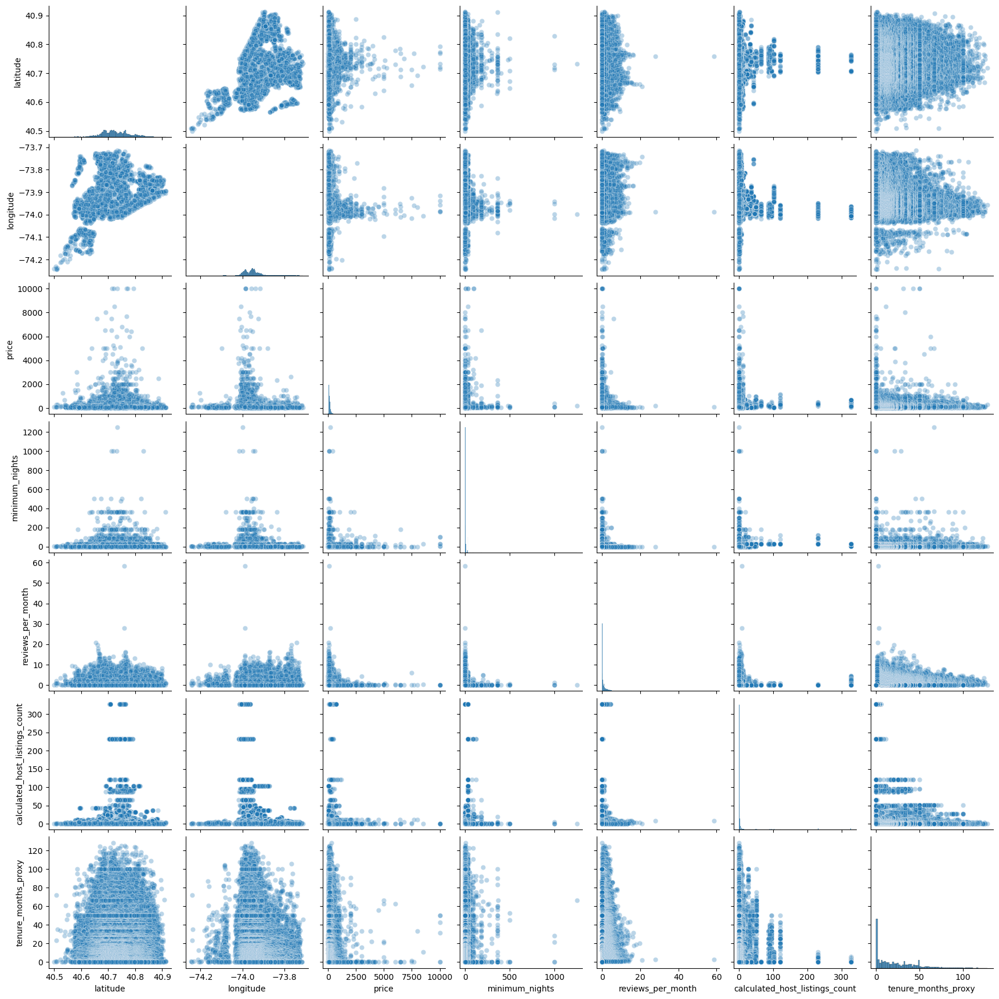

In [ ]:
# Jiaqi
# Outlier identification-2 variable outliers

sns.pairplot(df_drop1, diag_kind="hist", plot_kws={"alpha":0.3})
plt.show()

Yes, the pairwise scatterplots reveal several clear outliers in the dataset.

Across multiple numerical variables, a number of points fall far outside the main dense clusters. Specifically:
Price: Several listings show extremely high prices, far above typical values.
Minimum Nights: Some listings require unusually long minimum stays, forming strong vertical outliers.
Number of Reviews: A few listings have exceptionally high review counts, appearing as isolated points on the right.
Reviews per Month: Several observations have unusually high monthly review activity, creating horizontal outliers.
Location: A few latitude/longitude points lie outside the main NYC region, indicating geographic outliers.

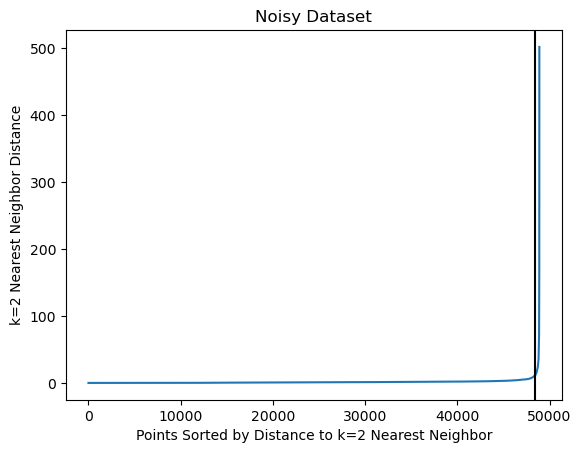

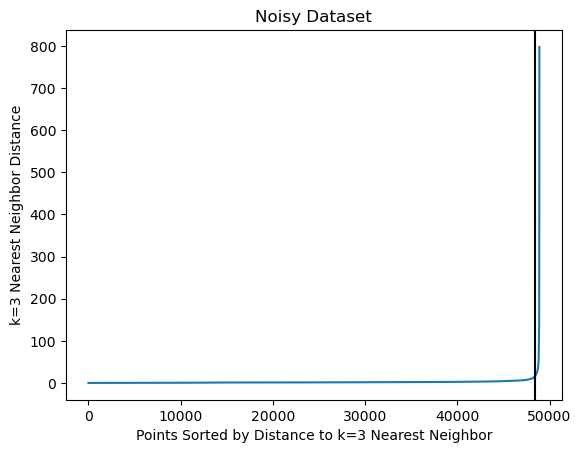

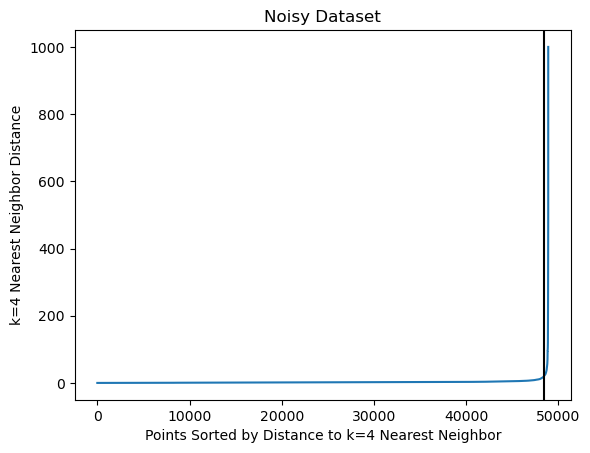

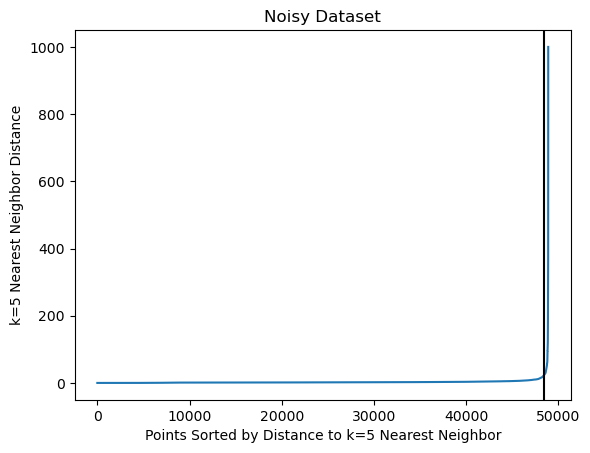

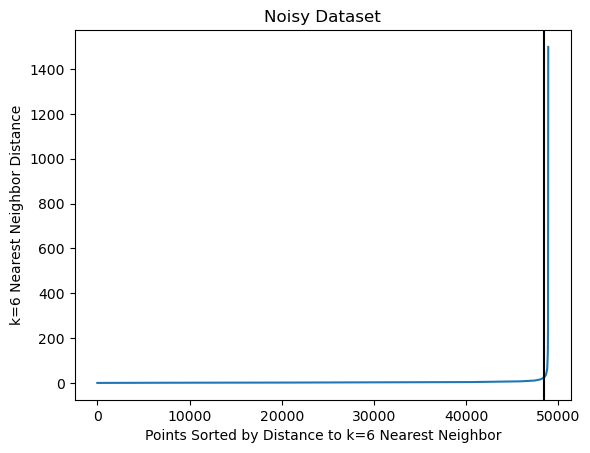

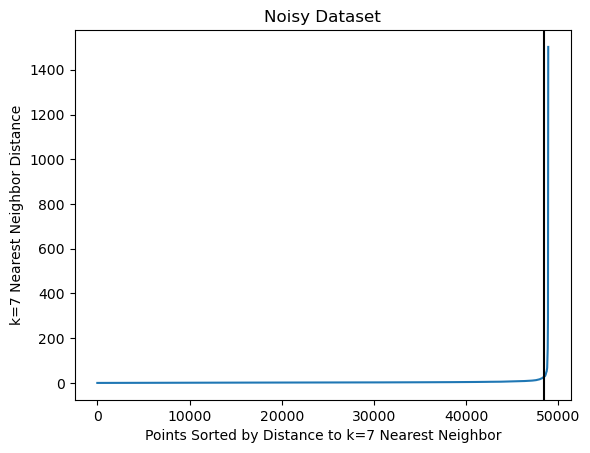

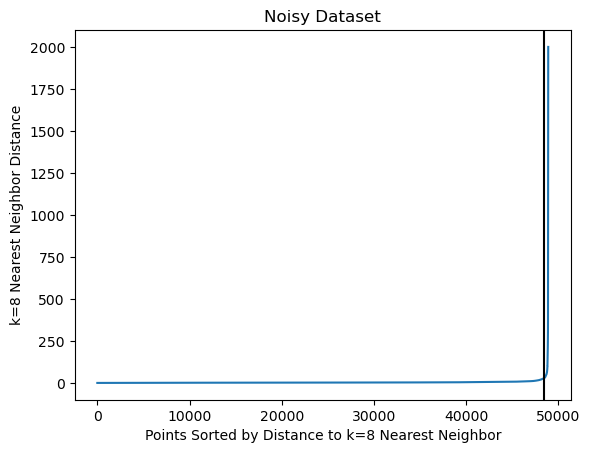

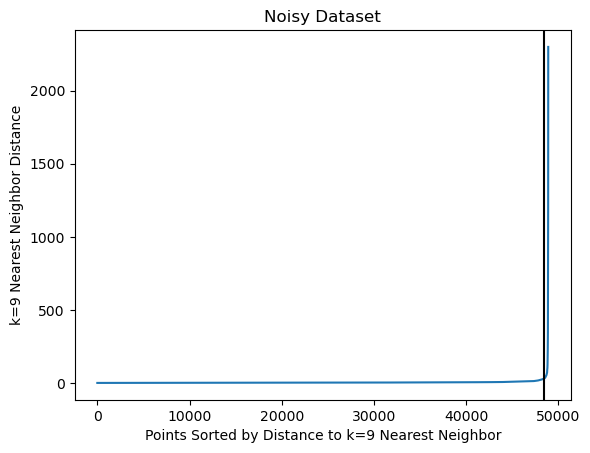

In [ ]:
# Jiaqi
# Outlier identification-3 variable outliers
X = df_drop1.values

for k in range(2,10):
    nbrs = NearestNeighbors(n_neighbors=k, algorithm='ball_tree').fit(X)
    distances, indices = nbrs.kneighbors(X)

    plt.plot(np.sort(distances.T[k-1]))
    plt.axvline(x=48381, color='black')
    plt.xlabel('Points Sorted by Distance to k=%s Nearest Neighbor'%k)
    plt.ylabel('k=%s Nearest Neighbor Distance'%k)
    plt.title('Noisy Dataset')
    plt.show()

To detect outliers in high-dimensional space, we employed the k-nearest neighbor (kNN) distance-based method discussed in class. For different values ​​of k, we calculated the distance between each observation and its k-th nearest neighbor and examined the sorted distance curve. According to the KNN distance plot, the curve for most observations remained very flat, then showed a sharp increase near the far right end. The inflection point appeared at approximately the 48000th sorted point, after which the distance increased dramatically. Therefore, approximately 49000-48000 = 1000 observations were considered multivariate outliers or noise points.

Given our research motivation is to understand common patterns in Airbnb listings and to remove extreme multivariate outliers rather than clustering them separately, retaining these points could affect distance-based clustering algorithms and mask truly meaningful clustering structures among typical listings.

Removing outliers can improve clustering stability but also has drawbacks; for example, removing these observations might exclude some rare but potentially interesting types of listings, such as ultra-luxury properties. The presence of outliers also influences algorithm selection. Algorithms highly sensitive to extreme points or relying on global distance metrics (such as K-means) may perform poorly without proper outlier handling, which prompted us to introduce density-based methods in subsequent analyses.

In addition to handling outliers, we also assessed whether the dataset contained noise. We used the same kNN-based distance method to identify observations with unusually large average neighbor distances in the multivariate environment. These noise points might represent atypical listings with uncommon combinations of location, price, and host behavior. Therefore, we chose to include density-based clustering methods that naturally handle noise. We then performed several additional data cleaning steps. Listings with non-positive prices, minimum stay days exceeding 365 days, and duplicate records were removed. To address skewness, we log-transformed highly skewed variables such as price and host listing count and capped extreme values ​​at high quantiles. After all data cleaning, approximately 1% of the observations were removed from the dataset.

## 4. Basic Descriptive Analytics

Before applying any unsupervised learning algorithms, we conducted basic descriptive analytics to better understand the structure and distribution of the dataset. Since the Airbnb dataset is a structured, tabular dataset composed of numerical attributes, we focus on summary statistics and pairwise relationships among the selected variables.

In [ ]:
#Jiaxin
#data clean

df_clean = df_drop1.copy()

df_clean = df_clean[df_clean["price"] > 0]
df_clean = df_clean[df_clean["minimum_nights"] <= 365]

df_clean = df_clean.drop_duplicates()

skewed_cols = [
    "price",
    "minimum_nights",
    "tenure_months_proxy",
    "reviews_per_month",
    "calculated_host_listings_count",  
]
geo_cols = ["latitude", "longitude"]

df_scaled_clean = df_clean.copy()

for c in skewed_cols:
    if c in df_scaled_clean.columns:
        df_scaled_clean[c] = np.log1p(df_scaled_clean[c])

c = "calculated_host_listings_count"
if c in df_scaled_clean.columns:
    cap = df_scaled_clean[c].quantile(0.95)   
    df_scaled_clean[c] = df_scaled_clean[c].clip(upper=cap)

scale_cols = [c for c in (skewed_cols + geo_cols) if c in df_scaled_clean.columns]

scaler = RobustScaler()  
df_scaled_clean[scale_cols] = scaler.fit_transform(df_scaled_clean[scale_cols])

multi_cols = scale_cols  
coords_multi = df_scaled_clean[multi_cols].values

nn = NearestNeighbors(n_neighbors=6)
nn.fit(coords_multi)
distances, _ = nn.kneighbors(coords_multi)
avg_dist = distances[:, 1:].mean(axis=1)

thr = np.quantile(avg_dist, 0.99)
mask_keep = avg_dist <= thr

df_scaled_final = df_scaled_clean.loc[df_scaled_clean.index[mask_keep]].copy()

df_raw_final = df_clean.loc[df_scaled_final.index].copy()



df_scaled_final = df_scaled_final.reset_index(drop=True)
df_raw_final = df_raw_final.reset_index(drop=True)



In [7]:
#Numerical attributes statistical summary_scaled
df_scaled_final.describe().T

,count,mean,std,min,25%,50%,75%,max
latitude,48381.0,0.084958,0.737966,-3.057301,-0.448278,0.001780,0.548367,2.601219
longitude,48381.0,0.072152,0.958637,-6.135897,-0.583761,-0.000855,0.407692,5.185897
price,48381.0,0.065111,0.731430,-2.467420,-0.460237,-0.010184,0.539763,4.609560
minimum_nights,48381.0,0.094872,0.776551,-0.630930,-0.630930,-0.261860,0.369070,4.110949
reviews_per_month,48381.0,0.251212,0.634938,-0.346491,-0.303323,0.000000,0.700934,2.991227
calculated_host_listings_count,48381.0,0.782737,1.409188,0.000000,0.000000,0.000000,1.000000,5.128534
tenure_months_proxy,48381.0,-0.148752,0.553051,-1.019390,-0.674579,0.003346,0.317170,0.781077


In [8]:
#Numerical attributes statistical summary_raw
df_raw_final.describe().T

,count,mean,std,min,25%,50%,75%,max
latitude,48381.0,40.729285,0.053897,40.49979,40.690340,40.723210,40.76313,40.913060
longitude,48381.0,-73.952313,0.044864,-74.24285,-73.983010,-73.955730,-73.93661,-73.712990
price,48381.0,146.736549,165.702927,10.00000,69.000000,105.000000,175.00000,7500.000000
minimum_nights,48381.0,6.554391,14.502914,1.00000,1.000000,2.000000,5.00000,365.000000
reviews_per_month,48381.0,1.088953,1.564129,0.00000,0.040000,0.370000,1.59000,19.750000
calculated_host_listings_count,48381.0,7.180897,33.116884,1.00000,1.000000,1.000000,2.00000,327.000000
tenure_months_proxy,48381.0,21.980350,22.810414,0.00000,1.538462,14.848485,36.00000,128.571429


For each numerical variable used in the clustering analysis, we computed standard summary statistics, including the mean, standard deviation, minimum, maximum, and quartiles. These summaries reveal substantial heterogeneity across listings. Variables such as price, reviews_per_month, and calculated_host_listings_count exhibit strong right skewness, indicating the presence of a small number of highly active or high-priced listings alongside a large number of more typical observations. In contrast, latitude and longitude show relatively tight distributions, reflecting the spatial concentration of listings within New York City. The summary statistics also highlight differences in scale across variables. For example, price and minimum stay requirements span much wider numeric ranges than review activity measures.

The dataset used for clustering does not include categorical variables as direct inputs to the unsupervised learning algorithms. Categorical fields such as neighborhood group and room type were intentionally excluded from the clustering variables to avoid imposing predefined groupings on the analysis. As a result, categorical summaries are not included in this section, and all descriptive analytics focus on numerical attributes.

To explore the relationships between variables, we performed pairwise scatter plots and correlation analysis on the numerical features. The results showed that properties with higher prices tend to have higher minimum stay requirements, suggesting that high-end properties are typically geared towards long-term guests. Review activity, measured by the number of reviews per month, was negatively correlated with the minimum stay duration, indicating that properties with shorter stays are booked more frequently. Meanwhile, when analyzing variables in pairs, many relationships between variables exhibited non-linear or weak correlations, especially when considering geographical location and host behavior variables simultaneously. This suggests that meaningful structures within the dataset may only become apparent when considering multiple variables together.

## 5. Scaling Decisions

The numerical variables used in this analysis exhibit substantially different scales and distributional properties. For example, price and minimum stay requirements span wide numeric ranges, while geographic coordinates vary within relatively narrow intervals. Without scaling, distance-based clustering algorithms would be disproportionately influenced by variables with larger magnitudes, potentially obscuring meaningful multivariate structure in the data.

Based on these considerations, scaling was deemed necessary. Prior to scaling, highly skewed variables,including price, reviews per month, tenure proxy, and host listing counts,were transformed using a logarithmic transformation to reduce skewness and stabilize variance. Additionally, extreme values in host listing counts were capped at high quantiles to limit the influence of unusually large observations.

After these transformations, a RobustScaler was applied to the selected numerical variables. This scaling method centers variables using the median and scales them based on the interquartile range, making it less sensitive to remaining outliers compared to standard normalization techniques. The scaled dataset was then used as the final input for all clustering algorithms to ensure that each variable contributed comparably to distance computations.


## 6. Clusterability and Clustering Structure Questions (Found below in K-means/HDBSCAN part)

## 7. Clustering Algorithm Selection Motivation (Found below in K-means/HDBSCAN/DBSCAN part)

## 8. Clustering the Dataset and Post-Cluster Analysis for Algorithm 1 (K-means)

Clustering Algorithm #1 – k-means

We chose k-means as our first clustering algorithm because it's the baseline for market-segmentation research. Our research goal is to discover broad market segments of Airbnb listings (e.g., different price–demand–location profiles).

K-means is the standard baseline for this type of segmentation, and it is well-suited because the analysis relies on numerical variables, including geographical coordinates.It is simple, well-understood, and widely used in practice. Using k-means first gives us a clear reference model that we can later compare to more flexible methods such as HDBSCAN.


In [ ]:
# Jiaxin
# K-means
random_state = 333

cluster_vars = [
    "latitude", "longitude",
    "price", "minimum_nights",
    "tenure_months_proxy",
    "reviews_per_month",
    "calculated_host_listings_count"
]

X = df_scaled_final[cluster_vars].values

k = 2, avg inertia = 178901.53
k = 3, avg inertia = 152597.96
k = 4, avg inertia = 138638.72
k = 5, avg inertia = 125097.11
k = 6, avg inertia = 113924.54
k = 7, avg inertia = 104574.58
k = 8, avg inertia = 98834.49
k = 9, avg inertia = 94731.02
k = 10, avg inertia = 90940.58
k = 11, avg inertia = 87466.25
k = 12, avg inertia = 84649.05
k = 13, avg inertia = 82158.73
k = 14, avg inertia = 79717.46
k = 15, avg inertia = 77347.60


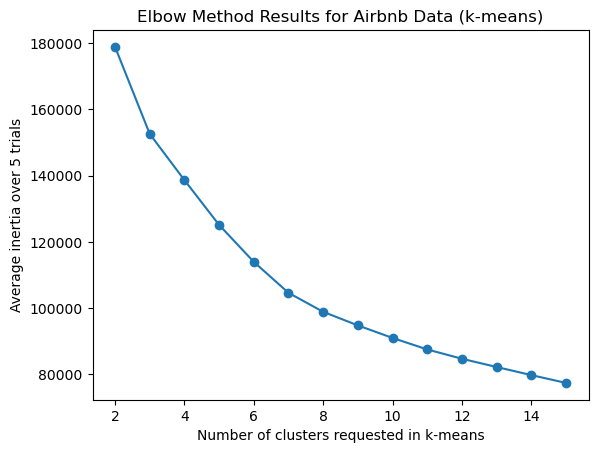

In [ ]:
#Elbow Plot
cluster_num_list = range(2, 16)   
avg_inertia_list = []

for k in cluster_num_list:
    inertia_trials = []
    for trial in range(5):  
        kmeans = KMeans(
            n_clusters=k,
            n_init=10,
            random_state=random_state + trial
        ).fit(X)
        inertia_trials.append(kmeans.inertia_) 
    avg_inertia = np.mean(inertia_trials)
    avg_inertia_list.append(avg_inertia)
    print(f"k = {k}, avg inertia = {avg_inertia:.2f}")

plt.plot(cluster_num_list, avg_inertia_list, marker='o')
plt.xlabel("Number of clusters requested in k-means")
plt.ylabel("Average inertia over 5 trials")
plt.title("Elbow Method Results for Airbnb Data (k-means)")
plt.show()


Parameter Selection and Elbow Analysis

The curve does not exhibit a clear "elbow" point where the marginal gain in fit suddenly levelsoff. lnstead, the reduction in inertia is fairly smooth and gradual across the full range of k. Because of thislack of a sharp elbow, the elbow method alone is inconclusive for selecting a single best k. Therefore, we combine this plot with the silhouette analysis and cluster interpretability, and in the end wechoose k =5 as a reasonable compromise between model fit and segmentation granularity.

k = 2, avg silhouette = 0.4583
k = 3, avg silhouette = 0.2174
k = 4, avg silhouette = 0.1637
k = 5, avg silhouette = 0.1834
k = 6, avg silhouette = 0.1807
k = 7, avg silhouette = 0.1917
k = 8, avg silhouette = 0.1861
k = 9, avg silhouette = 0.1810
k = 10, avg silhouette = 0.1788


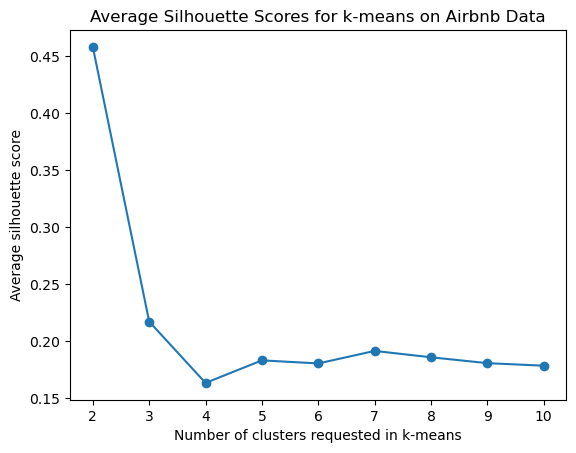

In [ ]:
#Silhouette Plot
cluster_num_list = range(2, 11)
avg_sil_list = []

for k in cluster_num_list:
    sil_trials = []
    for trial in range(3):
        kmeans = KMeans(
            n_clusters=k,
            n_init=10,
            random_state=random_state + trial
        ).fit(X)
        labels = kmeans.labels_
        sil = silhouette_score(X, labels, metric="euclidean")
        sil_trials.append(sil)
    avg_sil = np.mean(sil_trials)
    avg_sil_list.append(avg_sil)
    print(f"k = {k}, avg silhouette = {avg_sil:.4f}")

plt.plot(cluster_num_list, avg_sil_list, marker='o')
plt.xlabel("Number of clusters requested in k-means")
plt.ylabel("Average silhouette score")
plt.title("Average Silhouette Scores for k-means on Airbnb Data")
plt.show()


k_best = 5
kmeans_best = KMeans(n_clusters=k_best, n_init=10, random_state=333)
kmeans_best.fit(X)

labels_km = kmeans_best.labels_

print("Cluster sizes:", np.bincount(labels_km))
print("Average silhouette:", silhouette_score(X, labels_km))

Silhouette analysis.
We computed average silhouette scores for k-means with k from 2 to 10. The score is highest for k2 (0.46), and then drops sharply when moving to k=3 andk =4. For k > 4, the silhouette valuesare relatively stable in a narrow range (0.16-0.19). Within this range, k =5 achieves one of thehigher scores (0.18), indicating a reasonable balance between cluster cohesion and separation.
Although k = 2 gives the best raw silhouette score, it corresponds to an overly coarse partition and is not very informative for market segmentation. We therefore select k = 5 as our final model, which still maintains acceptable silhouette performancewhile providing richer and more interpretable Airbnb host/listing segments.


In [11]:
k_best = 5
kmeans_best = KMeans(n_clusters=k_best, n_init=10, random_state=333)
kmeans_best.fit(X)

labels_km = kmeans_best.labels_

print("Cluster sizes:", np.bincount(labels_km))
print("Average silhouette:", silhouette_score(X, labels_km))

Cluster sizes: [16099  2974 14856  4938  9514]
Average silhouette: 0.18341112749617292


Running t-SNE with perplexity=20, random_state=0


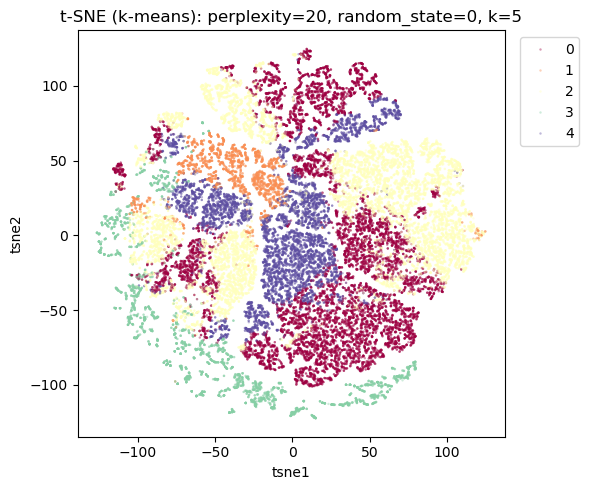

Running t-SNE with perplexity=20, random_state=1


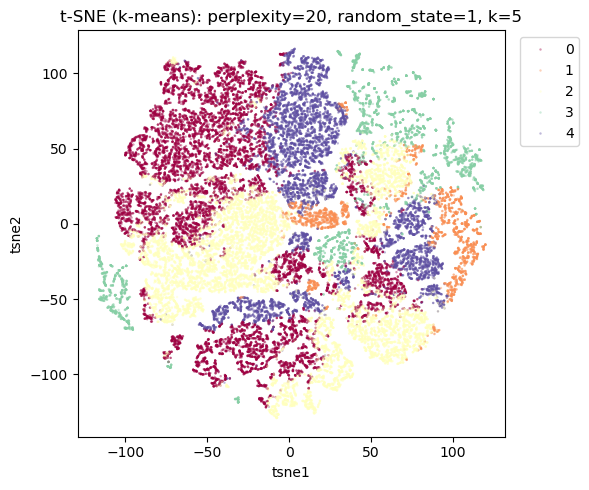

Running t-SNE with perplexity=40, random_state=0


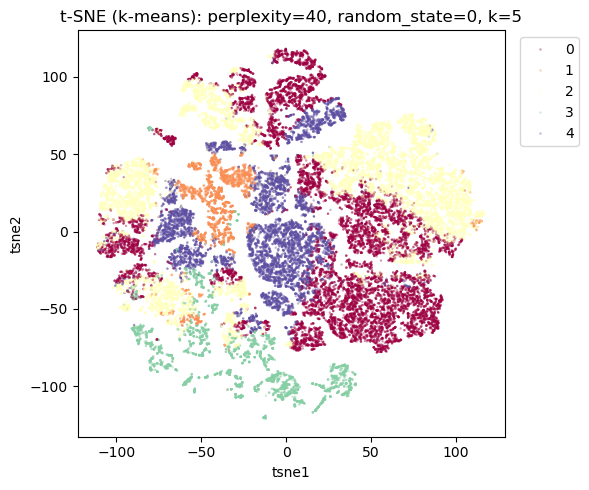

Running t-SNE with perplexity=40, random_state=1


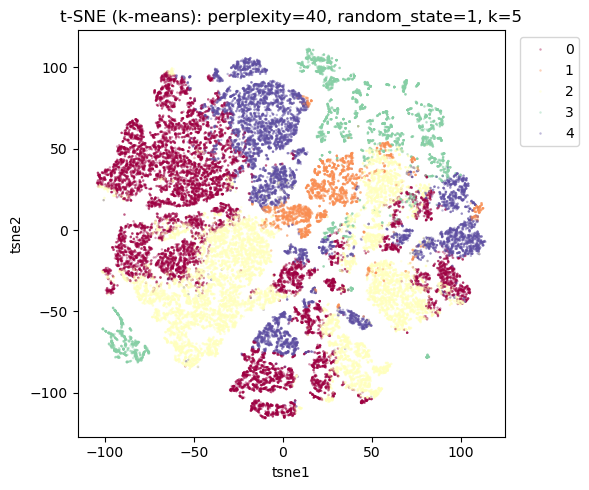

Running t-SNE with perplexity=50, random_state=0


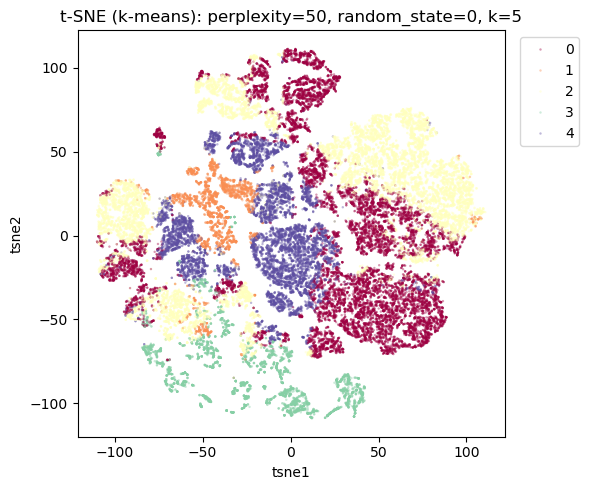

Running t-SNE with perplexity=50, random_state=1


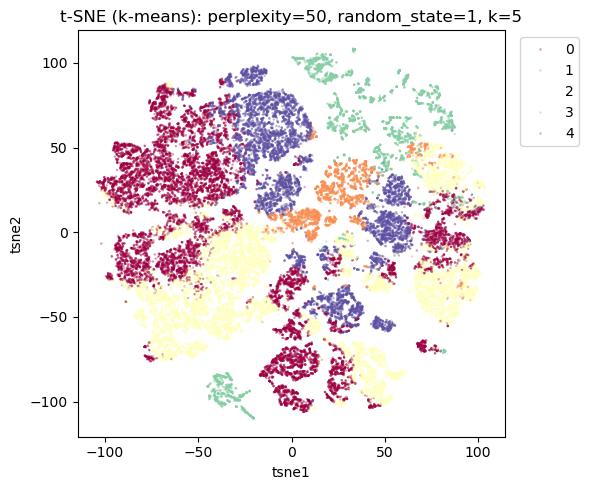

Running t-SNE with perplexity=60, random_state=0


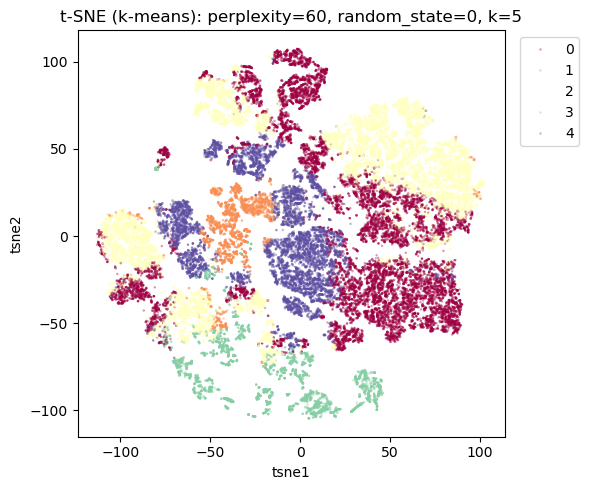

Running t-SNE with perplexity=60, random_state=1


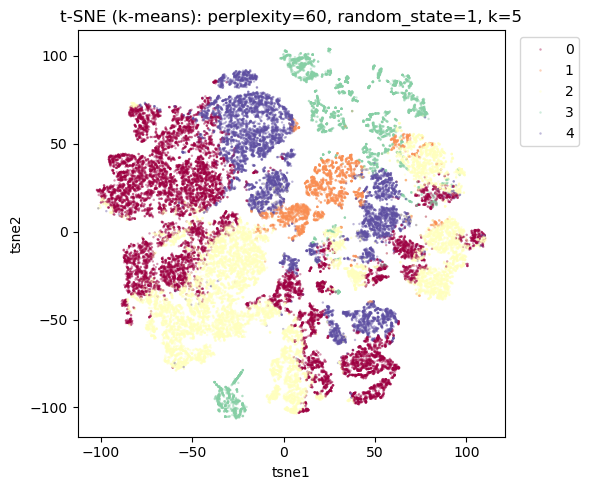

Running t-SNE with perplexity=80, random_state=0


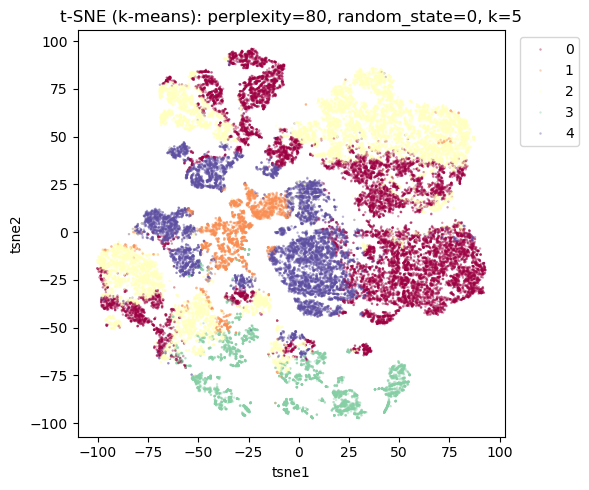

Running t-SNE with perplexity=80, random_state=1


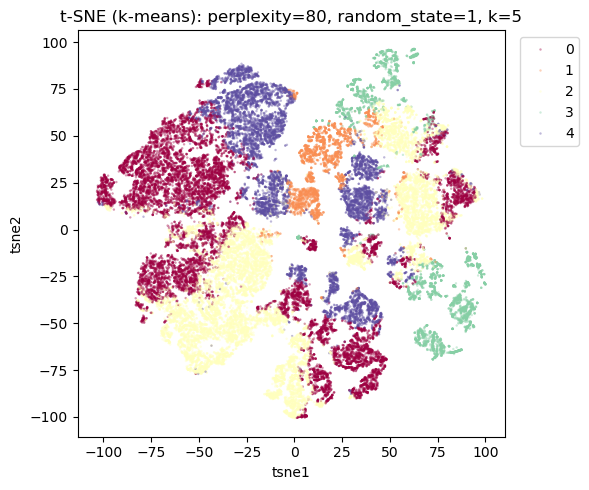

Running t-SNE with perplexity=100, random_state=0


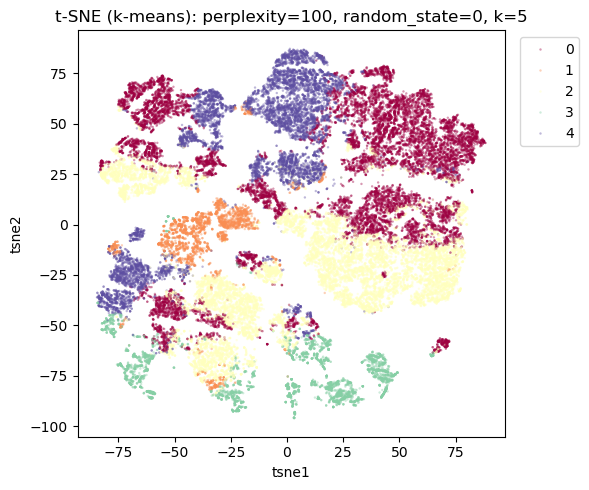

Running t-SNE with perplexity=100, random_state=1


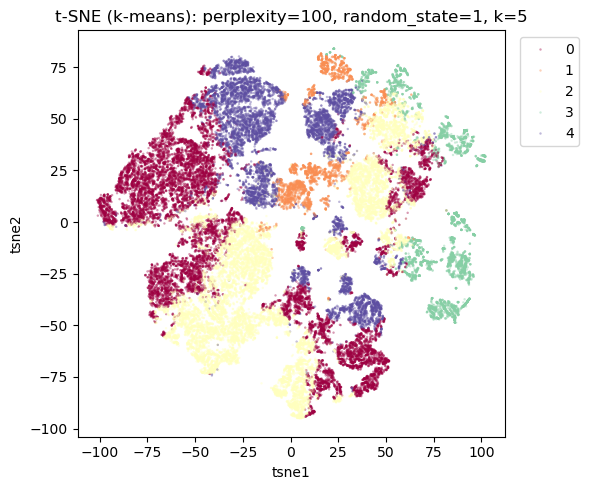

In [ ]:
# tSNE (k=5)

k_best = 5   
perplexity_list  = [20, 40, 50, 60, 80, 100]     
random_state_list = [0,1]          

for perp in perplexity_list:
    for rs in random_state_list:
        print(f"Running t-SNE with perplexity={perp}, random_state={rs}")

        tsne = TSNE(
            n_components=2,
            perplexity=perp,
            random_state=rs,
            init='random'
        )
        X_tsne = tsne.fit_transform(X)

        df_tsne = pd.DataFrame(X_tsne, columns=["tsne1", "tsne2"])
        df_tsne["cluster_km"] = labels_km

        plt.figure(figsize=(6, 5))
        sns.scatterplot(
            x="tsne1", y="tsne2",
            hue="cluster_km",        
            data=df_tsne,
            palette="Spectral",      
            s=3,
            alpha=0.4,
            linewidth=0
        )

        plt.title(f"t-SNE (k-means): perplexity={perp}, random_state={rs}, k={k_best}")
        plt.xlabel("tsne1")
        plt.ylabel("tsne2")
        plt.legend(bbox_to_anchor=(1.02, 1), loc="upper left")  
        plt.tight_layout()
        plt.show()


t-SNE Plot Corroboration

We ran t-SNE on the scaled Airbnb data for multiple parameter settings (perplexity = 20, 40, 50, 60, 80, 100 and two random seeds) and color-coded each embedding using the k-means labels with k=5. The configuration withperplexity = 100 and random state = 0 somehow produces the clearest separation of color-coded regions. 

If the k-means assumptions were roughly satisfied in the original feature space (compact, roughly spherical, and well-separated clusters), we would expect each color to form one or a few contiguous blobs in the t-SNE plot, with clear boundaries between colors.

Instead, the t-SNE visualization shows that each color is broken into many disconnected islands and long, irregular shapes. Different colors are heavily interwoven and overlap in several local neighborhoods. This means that points that are assigned to different k-means clusters often appear as close neighbors in the t-SNE space, while points with the same k-means label can be far apart. Because t-SNE preserves local neighborhood structure, this pattern suggests that the k-means clusters are not capturing well-separated, roughly convex groups in the original data and therefore violate key geometric properties usually associated with k-means.

## 6. Clusterability and Clustering Structure

Describe the underlying Clustering Structure of the Dataset

Is the dataset clusterable?
Yes. The t-SNE visualization shows clear grouping patterns in the low-dimensional embedding, with multiple dense regions separated by relatively sparse areas. This indicates that the dataset exhibits an inherent clustering structure rather than a uniform or continuous distribution.

Approximately how many underlying clusters does the data have?
The t-SNE plot suggests that the dataset contains approximately six underlying clusters.
These clusters appear as visually distinct regions in the embedding, including one large dominant cluster and several smaller, more compact clusters.

What are the shapes of the underlying clusters?
The underlying clusters exhibit irregular, non-spherical shapes.
Some clusters appear elongated or curved, while others are compact but non-circular. This suggests that the data does not satisfy the assumptions of spherical or convex cluster shapes, making density-based clustering approaches more appropriate than centroid-based methods such as k-means.

Are the clusters balanced in size?
No.
The clusters are highly imbalanced in size. One cluster contains a substantial proportion of the observations, while several other clusters are much smaller and more localized. This imbalance indicates heterogeneous data density across the feature space.

Are there any clusters that are not well separated?
Yes.
While most clusters are reasonably well separated, some smaller clusters partially overlap with neighboring clusters or are connected through transitional regions. This suggests the presence of soft boundaries between certain clusters rather than sharp separations.

Is there any evidence of nested cluster relationships?
Yes.
The t-SNE plot provides evidence of nested or hierarchical cluster structure, where smaller, denser sub-clusters appear embedded within or adjacent to larger clusters. This pattern is consistent with hierarchical density-based clustering behavior and suggests multi-scale structure in the data.


Clustering Structure and Attribute Association
To assess the association between individual attributes and the clustering structure, the t-SNE embedding was color-coded by each attribute in turn. Attributes that exhibit smooth gradients or consistent patterns within clusters demonstrate stronger association with the clustering structure, while attributes that vary randomly across clusters show weaker association.
Overall, several attributes display meaningful alignment with the t-SNE-suggested clusters, indicating that the clustering structure is not arbitrary but reflects systematic variation in the original feature space. Other attributes show weaker or no visible association, suggesting they contribute less to cluster separation.

Understanding the t-SNE Algorithm: Important Limitations
While t-SNE is useful for visualizing clustering structure, it does not reveal several important properties of our original dataset:
 1. Global distances are not preserved
Distances between far-apart clusters in the t-SNE plot do not represent true distances in the original feature space.
 2. Cluster densities are distorted
The apparent density of clusters in the t-SNE embedding does not accurately reflect their true size or density in the original data.
 3. The embedding is sensitive to hyperparameters and randomness
Different choices of perplexity or random initialization can lead to different visual layouts, even when the underlying cluster structure is similar.
 4. No direct interpretability of axes
The t-SNE axes do not correspond to interpretable linear combinations of the original variables, limiting its usefulness for direct feature interpretation.



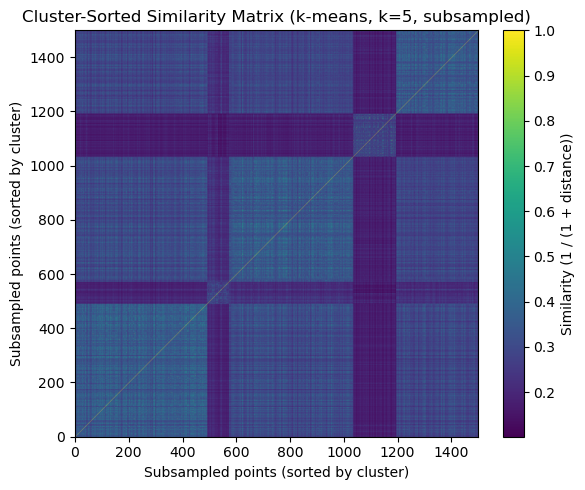

In [19]:
#Cluster-Sorted Similarity Matrix
k_best = 5
kmeans_best = KMeans(n_clusters=k_best, n_init=10, random_state=333).fit(X)

df_cluster_km = df_raw_final.copy()
df_cluster_km["cluster_km"] = kmeans_best.labels_


labels = df_cluster_km["cluster_km"].values
n_samples = X.shape[0]

sample_size = min(1500, n_samples)
rng = np.random.RandomState(42)
subset_idx = rng.choice(n_samples, size=sample_size, replace=False)

X_sub = X[subset_idx]
labels_sub = labels[subset_idx]

unique_labels_sub = np.unique(labels_sub)
sorted_labels = sorted(unique_labels_sub)

order = np.argsort([sorted_labels.index(lab) for lab in labels_sub])
X_sub_sorted = X_sub[order]
labels_sub_sorted = labels_sub[order]

dist_sub = pairwise_distances(X_sub_sorted, metric="euclidean")
sim_sub = 1 / (1 + dist_sub)   

plt.figure(figsize=(6, 5))
plt.imshow(sim_sub, aspect="auto", origin="lower")
plt.colorbar(label="Similarity (1 / (1 + distance))")
plt.title(f"Cluster-Sorted Similarity Matrix (k-means, k={k_best}, subsampled)")
plt.xlabel("Subsampled points (sorted by cluster)")
plt.ylabel("Subsampled points (sorted by cluster)")
plt.tight_layout()
plt.show()


Cluster-Sorted Similarity Matrix

To examine intra-cluster cohesion and inter-cluster separation, we constructed a clustering similarity matrix using randomly sampled observational data. After sorting the similarity matrix according to the k-means clustering labels, it exhibited an approximate block-diagonal structure, indicating that k-means effectively groups observational data with high internal similarity. However, these blocks were not uniform, with some clusters exhibiting weaker cohesion than others. This suggests that k-means may group observational data with different structures together when the data are close in terms of global distance.

Outlier and Noise Considerations

The K-means algorithm assigns each observation to a cluster, but it cannot identify noise or outliers. Therefore, a typical data points and isolated observations are forced into the nearest cluster, which can distort cluster boundaries and summary statistics. For this reason, we chose to use a density-based clustering method in our subsequent analysis, as these methods are better suited for handling noisy and unevenly distributed data.

Summary of K-means Results

Overall, the k-means algorithm revealed the existence of a few broad categories of listings in the dataset's clustering structure. However, its reliance on hard assignments, sensitivity to outliers, and assumption of roughly spherical clusters limit its ability to capture the full complexity of the Airbnb market. These limitations motivate us to compare it with more flexible density-based clustering methods in subsequent sections.

In [12]:
df_result_km = df_raw_final.copy()
df_result_km["cluster_km"] = labels_km  

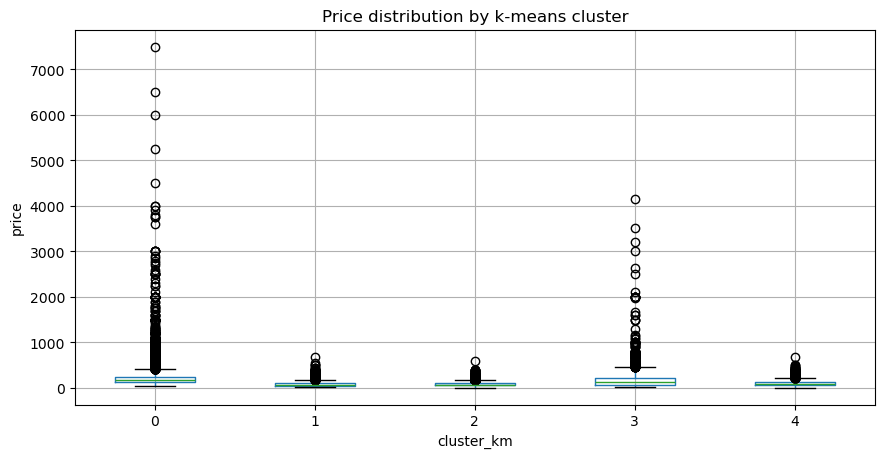

In [ ]:
#Statistical Summary
df_result_km.boxplot(column="price", by="cluster_km", figsize=(10, 5))
plt.title("Price distribution by k-means cluster")
plt.suptitle("")
plt.xlabel("cluster_km")
plt.ylabel("price")
plt.show()

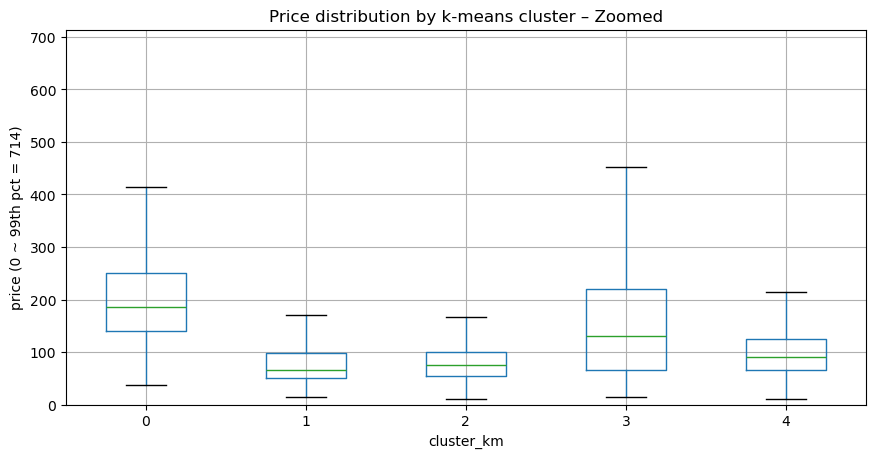

In [ ]:
upper = df_result_km["price"].quantile(0.99)   

ax = df_result_km.boxplot(
    column="price",
    by="cluster_km",
    figsize=(10, 5),
    showfliers=False
)
ax.set_ylim(0, upper)                      
ax.set_ylabel(f"price (0 ~ 99th pct = {upper:.0f})")

plt.title("Price distribution by k-means cluster – Zoomed")
plt.suptitle("")
plt.xlabel("cluster_km")
plt.show()

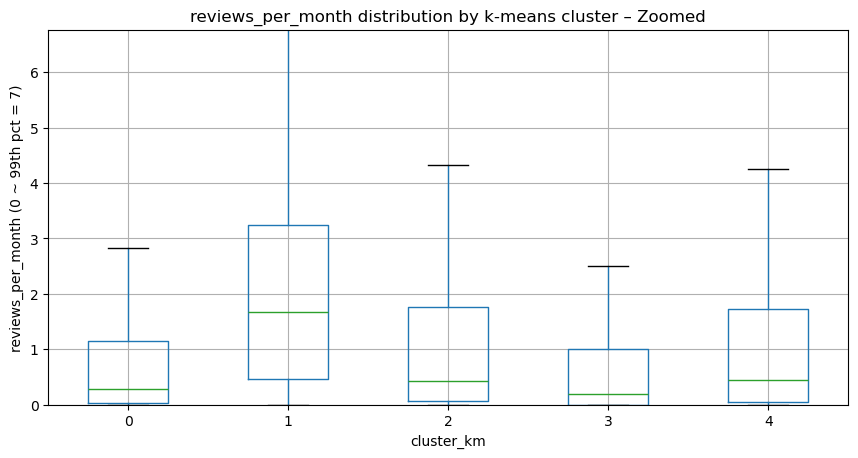

In [ ]:

upper = df_result_km["reviews_per_month"].quantile(0.99)   

ax = df_result_km.boxplot(
    column="reviews_per_month",
    by="cluster_km",
    figsize=(10, 5),
    showfliers=False
)
ax.set_ylim(0, upper)                     
ax.set_ylabel(f"reviews_per_month (0 ~ 99th pct = {upper:.0f})")

plt.title("reviews_per_month distribution by k-means cluster – Zoomed")
plt.suptitle("")
plt.xlabel("cluster_km")
plt.show()

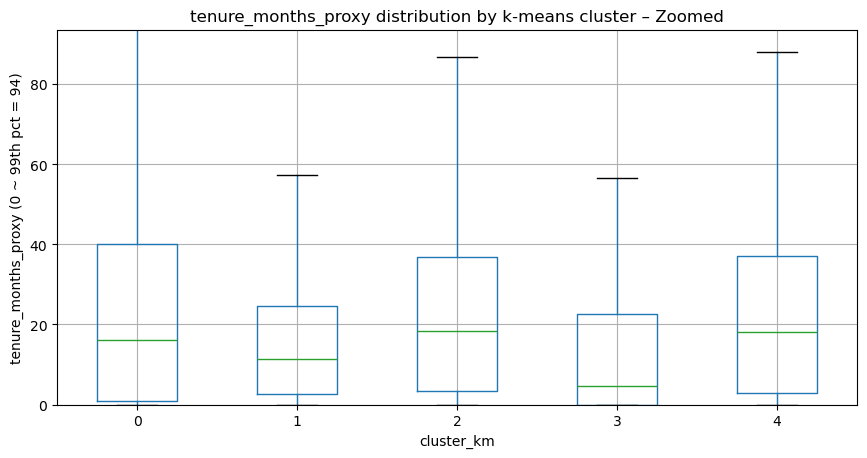

In [ ]:


upper = df_result_km["tenure_months_proxy"].quantile(0.99)  
ax = df_result_km.boxplot(
    column="tenure_months_proxy",
    by="cluster_km",
    figsize=(10, 5),
    showfliers=False
)
ax.set_ylim(0, upper)                      
ax.set_ylabel(f"tenure_months_proxy (0 ~ 99th pct = {upper:.0f})")

plt.title("tenure_months_proxy distribution by k-means cluster – Zoomed")
plt.suptitle("")
plt.xlabel("cluster_km")
plt.show()

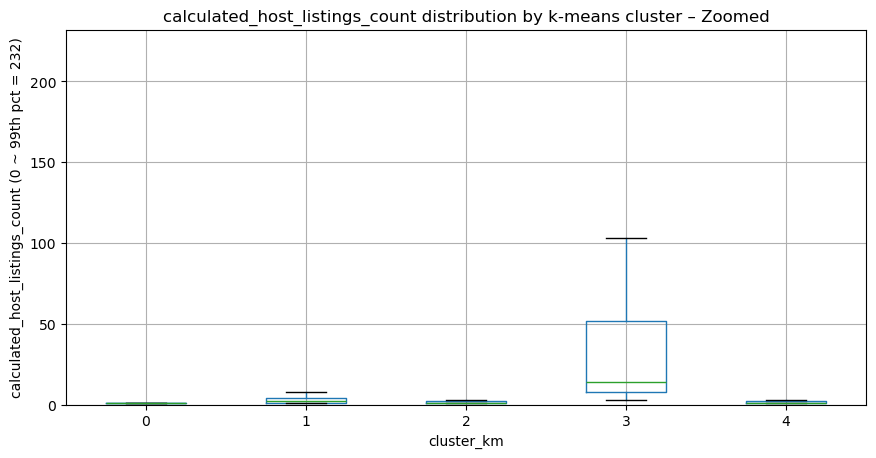

In [ ]:

upper = df_result_km["calculated_host_listings_count"].quantile(0.99)   
ax = df_result_km.boxplot(
    column="calculated_host_listings_count",
    by="cluster_km",
    figsize=(10, 5),
    showfliers=False
)
ax.set_ylim(0, upper)                      
ax.set_ylabel(f"calculated_host_listings_count (0 ~ 99th pct = {upper:.0f})")

plt.title("calculated_host_listings_count distribution by k-means cluster – Zoomed")
plt.suptitle("")
plt.xlabel("cluster_km")
plt.show()

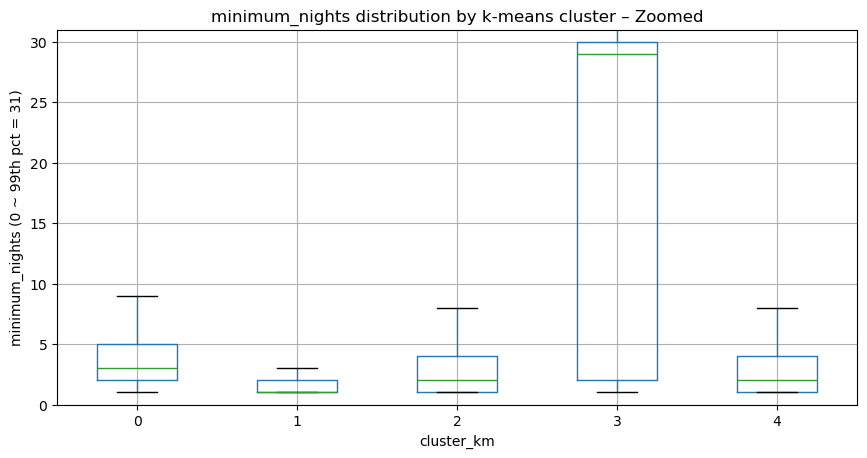

In [ ]:

upper = df_result_km["minimum_nights"].quantile(0.99)   

ax = df_result_km.boxplot(
    column="minimum_nights",
    by="cluster_km",
    figsize=(10, 5),
    showfliers=False
)
ax.set_ylim(0, upper)                       
ax.set_ylabel(f"minimum_nights (0 ~ 99th pct = {upper:.0f})")

plt.title("minimum_nights distribution by k-means cluster – Zoomed")
plt.suptitle("")
plt.xlabel("cluster_km")
plt.show()

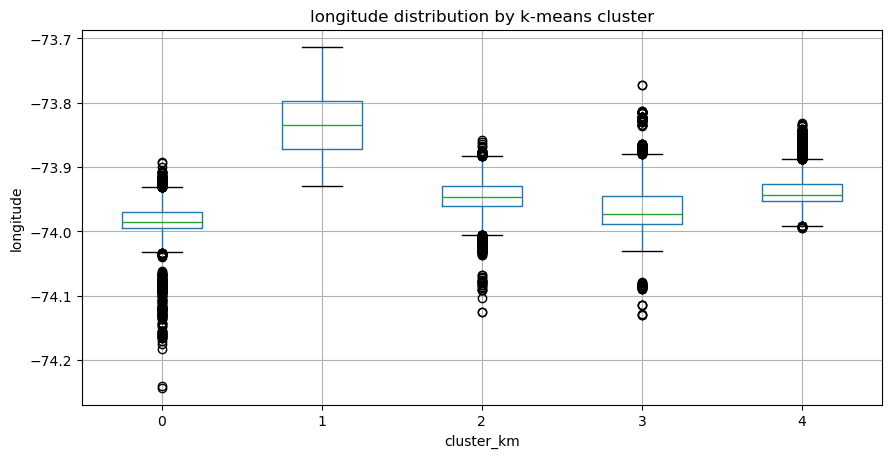

In [13]:

df_result_km.boxplot(column="longitude", by="cluster_km", figsize=(10, 5))
plt.title("longitude distribution by k-means cluster")
plt.suptitle("")
plt.xlabel("cluster_km")
plt.ylabel("longitude")
plt.show()

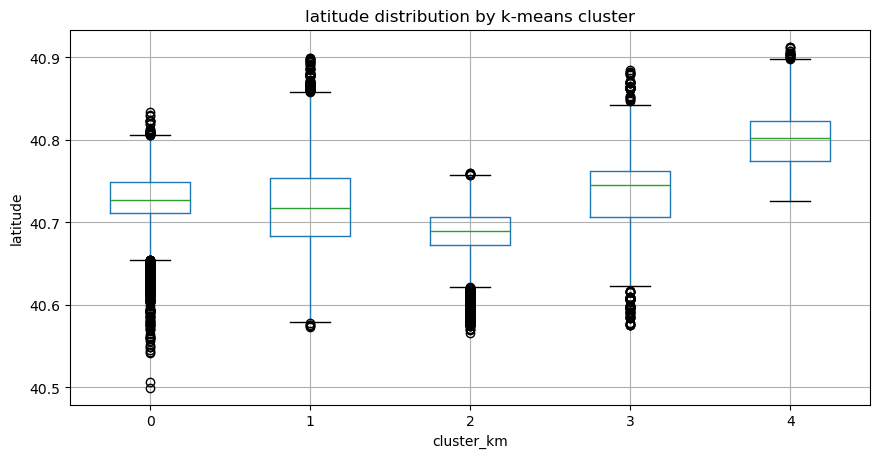

In [14]:
df_result_km.boxplot(column="latitude", by="cluster_km", figsize=(10, 5))
plt.title("latitude distribution by k-means cluster")
plt.suptitle("")
plt.xlabel("cluster_km")
plt.ylabel("latitude")
plt.show()

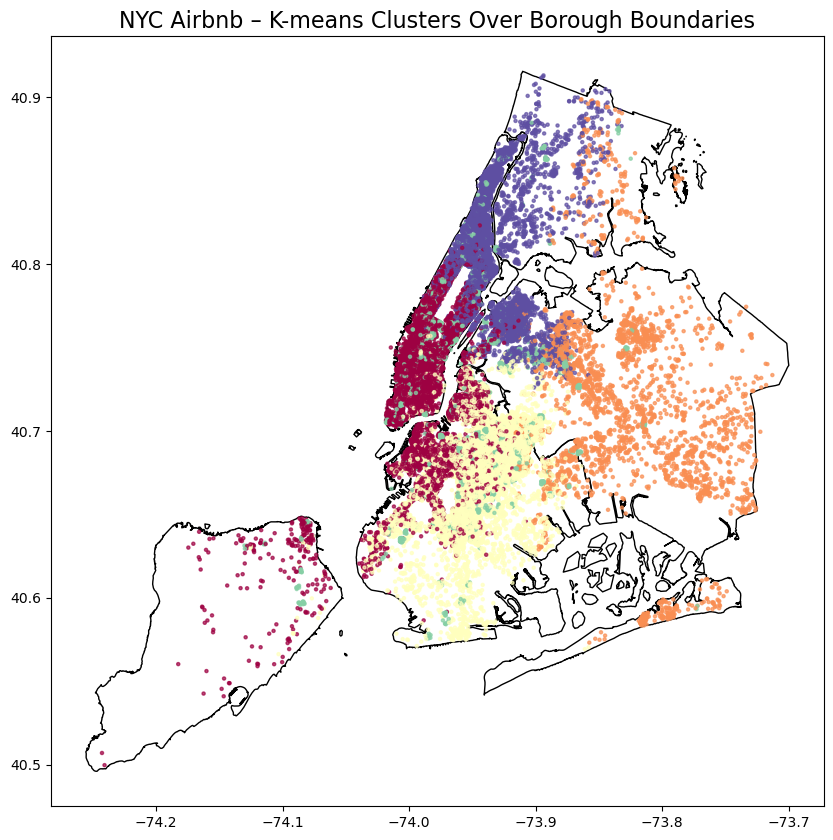

In [ ]:
# Map the classification results
boroughs = gpd.read_file("https://raw.githubusercontent.com/dwillis/nyc-maps/master/boroughs.geojson")
boroughs

fig, ax = plt.subplots(figsize=(10, 10))


boroughs.plot(ax=ax, edgecolor='black', facecolor='none', linewidth=1)
ax.scatter(
    df_result_km['longitude'], 
    df_result_km['latitude'], 
    c=df_result_km['cluster_km'], 
    cmap='Spectral', 
    s=5, alpha=0.7
)

ax.set_title("NYC Airbnb – K-means Clusters Over Borough Boundaries", fontsize=16)
plt.show()

### Insights:

Based on the provided map visualization, it appears that the K-means classification results are heavily influenced by geographical location and create clusters that generally correspond to distinct areas of the city. The map shows that the colors (which represent K-means clusters) are grouped together geographically. For example, most of Manhattan is dominated by a few specific colors (e.g., deep red, purple), while the listings in Queens/Brooklyn are largely another color (e.g., orange/yellow). K-means is a partitioning method that aims to minimize the variance within clusters. If the geographic location is the most important factor distinguishing the listings (in terms of price, room type, etc.), K-means will naturally create geographically contiguous clusters.

## 9.1 Clustering the Dataset and Post-Cluster Analysis for Algorithm 2 (HDBSCAN)

We selected HDBSCAN as our first clustering algorithm because it aligns closely with both our research motivation and the observed properties of the Airbnb dataset. Our goal is to uncover inherent market segments among listings while allowing for heterogeneous densities and the presence of atypical listings that may not belong to any meaningful group.

First, HDBSCAN is well suited for datasets that contain clusters of varying density. Based on exploratory analysis and descriptive statistics, Airbnb listings exhibit substantial heterogeneity in location, pricing, and host behavior. Dense urban clusters coexist with sparser regions, making algorithms that assume uniform cluster density inappropriate. HDBSCAN explicitly models this variation by identifying stable clusters across different density levels.

Second, HDBSCAN naturally identifies noise and outliers rather than forcing all observations into clusters. This property is particularly important given our earlier kNN-based analysis, which suggested the presence of multivariate noise points. Treating such observations as noise improves interpretability and prevents extreme or atypical listings from distorting the clustering structure.

Third, HDBSCAN provides soft clustering information through membership probabilities, allowing us to assess cluster stability and confidence. This is especially useful in a marketplace context where some listings may lie near the boundary between multiple market segments. These probabilistic outputs support more nuanced interpretation than a purely hard partition.

Overall, HDBSCAN is well matched to our dataset because it accommodates high-dimensional structure, variable density, and noise—key characteristics identified in our earlier analyses.


Parameter Tuning and Clustering Exploration

HDBSCAN does not require pre-specifying the number of clusters and therefore does not use an elbow plot for parameter selection. Instead, clustering behavior is governed by density-related parameters, primarily minimum cluster size and minimum samples. To explore the sensitivity of clustering results, we evaluated a wide range of parameter combinations by varying minimum cluster size from 500 to 2000 and minimum samples from 20 to 200.

For each parameter combination, we examined the number of detected clusters, the proportion of observations labeled as noise, and the average cluster persistence score. This systematic exploration allowed us to identify parameter settings that balance cluster stability and noise identification without over-fragmenting the data. The final parameter choice reflects a compromise between capturing meaningful structure and avoiding excessive noise labeling.

Elbow Plot

An elbow plot is not applicable for HDBSCAN because the algorithm does not allow the number of clusters to be directly specified. Any attempt to impose an elbow-style criterion would be conceptually inconsistent with the design of density-based hierarchical clustering. Instead, clustering structure is inferred from stability across density levels rather than from within-cluster variance minimization.

t-SNE Plot Corroboration

To corroborate clustering structure, we visualized the HDBSCAN results using t-SNE embeddings colored by cluster labels. Multiple parameter combinations were examined, and the selected clustering exhibited clear separation among major clusters while assigning ambiguous points to noise. In the t-SNE plots, core clusters appear as compact, well-separated regions, whereas noise points are dispersed across low-density areas of the embedding.

This visual alignment between HDBSCAN cluster assignments and the low-dimensional t-SNE structure provides evidence that the algorithm is capturing meaningful multivariate structure consistent with our research motivation of identifying coherent listing segments while isolating atypical observations.

Average Silhouette Score

Although the average silhouette score is highest when min_cluster_size = 600, this setting produces only two clusters (with many points either absorbed into these large groups or treated as noise). This result is not suitable for our goal of discovering the dataset’s intrinsic multi-cluster structure.

Cluster-Sorted Similarity Matrix

The sharp block-diagonal structure confirms that HDBSCAN produces clusters with high internal coherence and clear separation.

Outlier and Noise Handling

Outlier and noise handling is a central strength of HDBSCAN. A substantial fraction of observations were labeled as noise, consistent with earlier kNN-based analyses suggesting the presence of atypical listings in high-dimensional space. Rather than forcing these points into clusters, HDBSCAN isolates them, which aligns with our research motivation of focusing on common market structures while acknowledging the existence of rare or unusual listings.

Post-cluster analyses were therefore conducted primarily on non-noise observations, improving interpretability and stability of cluster summaries.

Fuzziness

HDBSCAN provides soft clustering information through cluster membership probabilities. These probabilities quantify the confidence of each point’s assignment and help identify observations that lie near cluster boundaries. Examination of these probabilities indicates that most core cluster members exhibit high confidence, while lower-confidence points tend to occur near transitions between clusters or near noise regions. This behavior supports the interpretability and robustness of the clustering results.

“Best” Clustering(s)

Based on parameter exploration, t-SNE corroboration, similarity matrix structure, and noise behavior, the selected HDBSCAN configuration provides the strongest evidence for identifying inherent clusters in the dataset. It captures stable, interpretable clusters while appropriately isolating noise, making it well aligned with our research goals.

Technique Shortcomings

Despite its strengths, HDBSCAN has limitations. Cluster boundaries may be sensitive to density variations, and clusters with very similar densities may be merged. Additionally, the presence of noise complicates the use of standard cluster evaluation metrics such as silhouette scores. 

While the similarity matrix and t-SNE plots suggest strong structure, perfect block-diagonal separation is not expected in real-world, high-dimensional market data.

“Best” Clustering Algorithm Results Presentation

Using the selected parameters, we re-ran HDBSCAN on the full cleaned dataset and visualized the results through geographic scatterplots, t-SNE embeddings, and variable-wise boxplots. These visualizations confirm that the identified clusters differ meaningfully in location, pricing, host behavior, and listing activity, providing an interpretable segmentation of the Airbnb marketplace.


In [ ]:
# Jiaqi
# Average Silhouette Score Plot

X = df_scaled_final.values

mcs_list = [200, 300, 400, 500, 600, 700, 800, 1000]  

rows = []
for mcs in mcs_list:
    clusterer = hdbscan.HDBSCAN(
        min_cluster_size=mcs,
        min_samples=20,                 
        metric="euclidean",
        cluster_selection_method="eom"
    )
    labels = clusterer.fit_predict(X)

    # exclude noise
    mask = labels != -1
    X_clean = X[mask]
    labels_clean = labels[mask]

    n_clusters = len(np.unique(labels_clean))
    noise_frac = np.mean(labels == -1)

    if n_clusters > 1 and len(labels_clean) >= 2:
        sil = silhouette_score(X_clean, labels_clean)
    else:
        sil = np.nan

    rows.append({
        "min_cluster_size": mcs,
        "avg_silhouette": sil,
        "n_clusters": n_clusters,
        "noise_frac": noise_frac
    })

df_sil = pd.DataFrame(rows)
df_sil

/Users/jessiaw/miniconda3/lib/python3.13/site-packages/sklearn/utils/deprecation.py:132: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
/Users/jessiaw/miniconda3/lib/python3.13/site-packages/sklearn/utils/deprecation.py:132: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
/Users/jessiaw/miniconda3/lib/python3.13/site-packages/sklearn/utils/deprecation.py:132: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
/Users/jessiaw/miniconda3/lib/python3.13/site-packages/sklearn/utils/deprecation.py:132: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
/Users/jessiaw/miniconda3/lib/python3.13/site-packages/sklearn/utils/deprecation.py:132: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in

,min_cluster_size,avg_silhouette,n_clusters,noise_frac
0,200,0.017845,9,0.215146
1,300,0.018643,7,0.219301
2,400,0.079124,5,0.190963
3,500,0.079124,5,0.190963
4,600,0.265750,2,0.059755
5,700,0.265750,2,0.059755
6,800,0.265750,2,0.059755
7,1000,0.265750,2,0.059755


/var/folders/4m/m7zs70mn0x57z_6k0gvp8ptc0000gn/T/ipykernel_19086/3153491726.py:9: UserWarning: No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
  plt.legend()


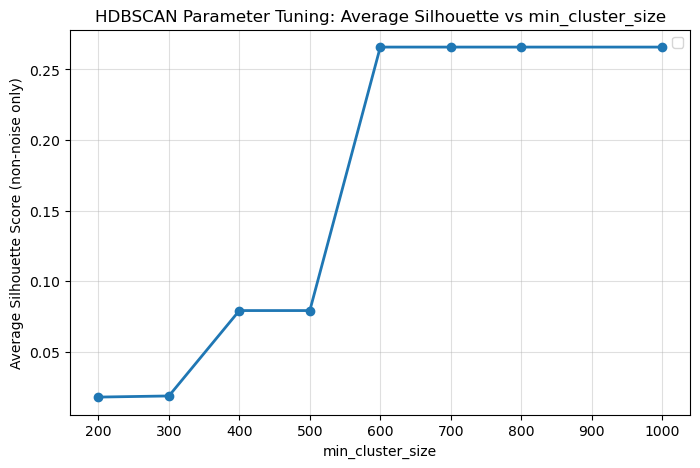

In [ ]:
plt.figure(figsize=(8,5))
plt.plot(df_sil["min_cluster_size"], df_sil["avg_silhouette"],
         marker="o", linewidth=2)

plt.xlabel("min_cluster_size")
plt.ylabel("Average Silhouette Score (non-noise only)")
plt.title("HDBSCAN Parameter Tuning: Average Silhouette vs min_cluster_size")
plt.grid(True, alpha=0.4)
plt.legend()
plt.show()

In [ ]:
# Jiaqi
# HDBSCAN 

X = df_scaled_final.values
candidates = []

for mcs in [500, 600, 1000, 1500, 2000]:
    for ms in [20, 30, 50, 100, 200]:
        clusterer = hdbscan.HDBSCAN(
            min_cluster_size=mcs,
            min_samples=ms,
            cluster_selection_method="eom"
        ).fit(X)
        labels = clusterer.labels_
        n_clusters = len(set(labels)) - (1 if -1 in labels else 0)
        noise = (labels == -1).mean()
        candidates.append([mcs, ms, n_clusters, noise, np.mean(clusterer.cluster_persistence_)])

df_try2 = pd.DataFrame(candidates, columns=["mcs","ms","n_clusters","noise_ratio","avg_persistence"])
df_try2.sort_values(["avg_persistence","noise_ratio"], ascending=[False, True]).head(20)


/opt/anaconda3/lib/python3.12/site-packages/sklearn/utils/deprecation.py:132: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
/opt/anaconda3/lib/python3.12/site-packages/sklearn/utils/deprecation.py:132: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
/opt/anaconda3/lib/python3.12/site-packages/sklearn/utils/deprecation.py:132: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
/opt/anaconda3/lib/python3.12/site-packages/sklearn/utils/deprecation.py:132: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
/opt/anaconda3/lib/python3.12/site-packages/sklearn/utils/deprecation.py:132: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
/opt/

,mcs,ms,n_clusters,noise_ratio,avg_persistence
15,1500,20,3,0.159629,0.209073
7,600,50,3,0.147351,0.204877
20,2000,20,3,0.159629,0.201000
3,500,100,3,0.222215,0.199207
1,500,30,4,0.163577,0.195474
8,600,100,3,0.222215,0.189714
2,500,50,4,0.164259,0.180366
0,500,20,5,0.190963,0.179577
6,600,30,4,0.163577,0.177806
13,1000,100,3,0.222215,0.175569


/Users/jessiaw/miniconda3/lib/python3.13/site-packages/sklearn/utils/deprecation.py:132: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
/Users/jessiaw/miniconda3/lib/python3.13/site-packages/sklearn/utils/deprecation.py:132: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(


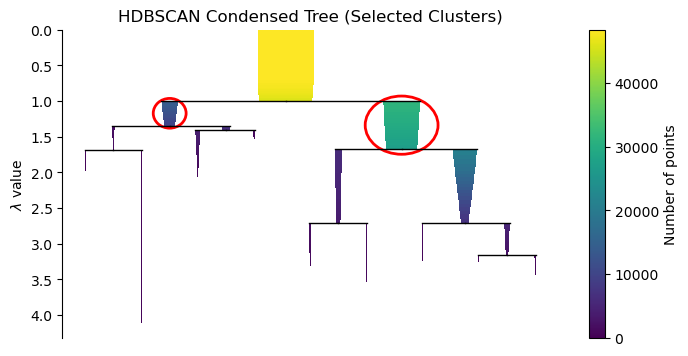

In [ ]:
#HDBSCAN:min_cluster=600
clusterer = hdbscan.HDBSCAN(
    min_cluster_size=600,
    min_samples=20,
    metric='euclidean',
    cluster_selection_method='eom'
)

clusterer.fit(X)

labels = clusterer.labels_
probabilities = clusterer.probabilities_

labels[:10], len(set(labels))

plt.figure(figsize=(8, 4))
clusterer.condensed_tree_.plot(select_clusters=True, cmap='viridis')
plt.title("HDBSCAN Condensed Tree (Selected Clusters)")
plt.show()

/opt/anaconda3/lib/python3.12/site-packages/sklearn/utils/deprecation.py:132: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
/opt/anaconda3/lib/python3.12/site-packages/sklearn/utils/deprecation.py:132: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(


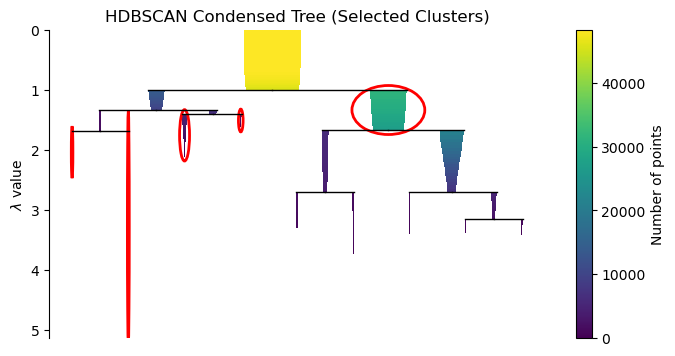

In [ ]:

clusterer = hdbscan.HDBSCAN(
    min_cluster_size=500,
    min_samples=20,
    metric='euclidean',
    cluster_selection_method='eom'
)

clusterer.fit(X)

labels = clusterer.labels_
probabilities = clusterer.probabilities_

labels[:10], len(set(labels))

plt.figure(figsize=(8, 4))
clusterer.condensed_tree_.plot(select_clusters=True, cmap='viridis')
plt.title("HDBSCAN Condensed Tree (Selected Clusters)")
plt.show()

In [69]:
cluster_counts = pd.Series(clusterer.labels_).value_counts().sort_index()
cluster_counts

-1     9239
 0    31344
 1      682
 2      810
 3     4294
 4     2012
Name: count, dtype: int64

In [71]:
df_result = df_raw_final.copy()
df_result['cluster'] = clusterer.labels_

In [ ]:

df_no_noise = df_result[df_result['cluster'] != -1] 
df_no_noise.describe()

,latitude,longitude,price,minimum_nights,reviews_per_month,calculated_host_listings_count,tenure_months_proxy,cluster
count,39142.000000,39142.000000,39142.000000,39142.000000,39142.000000,39142.000000,39142.000000,39142.000000
mean,40.730588,-73.957590,146.385928,5.353099,1.006649,7.023402,22.723039,0.593531
std,0.051014,0.034868,125.125168,9.015903,1.435889,35.587475,22.820297,1.248090
min,40.573800,-74.117020,18.000000,1.000000,0.000000,1.000000,0.000000,0.000000
25%,40.692580,-73.983850,75.000000,2.000000,0.040000,1.000000,1.700680,0.000000
50%,40.723480,-73.957875,115.000000,2.000000,0.320000,1.000000,16.822430,0.000000
75%,40.763220,-73.940940,180.000000,4.000000,1.460000,1.000000,37.390325,0.000000
max,40.908040,-73.721790,3000.000000,270.000000,13.330000,327.000000,128.571429,4.000000


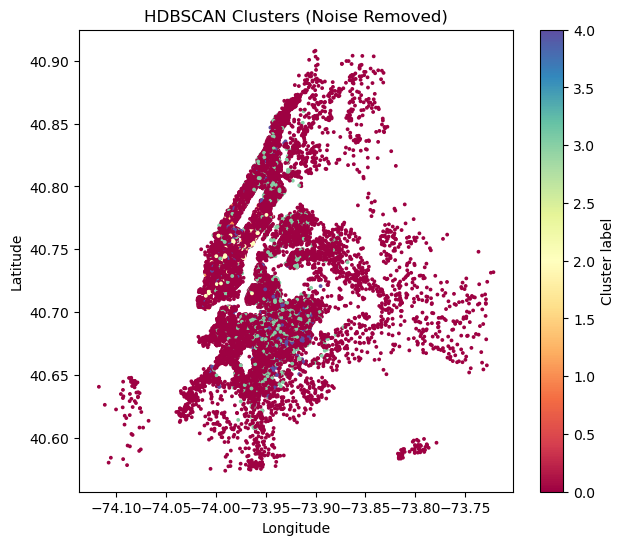

In [ ]:
# Outlier and Noise Handling
df_no_noise = df_result[df_result['cluster'] != -1]

plt.figure(figsize=(7,6))
plt.scatter(df_no_noise['longitude'], df_no_noise['latitude'],
            c=df_no_noise['cluster'], cmap='Spectral', s=3)
plt.colorbar(label='Cluster label')
plt.title("HDBSCAN Clusters (Noise Removed)")
plt.xlabel("Longitude")
plt.ylabel("Latitude")
plt.show()

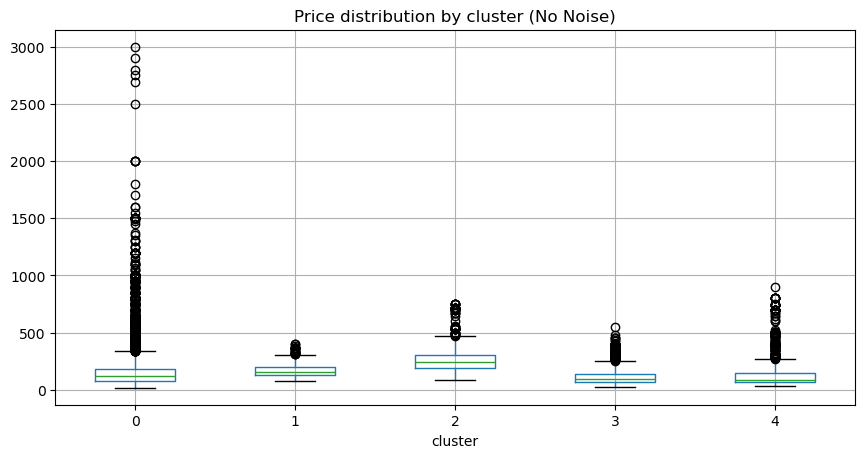

In [ ]:

#Statistical Summary
df_no_noise.boxplot(column='price', by='cluster', figsize=(10,5))
plt.title("Price distribution by cluster (No Noise)")
plt.suptitle("")
plt.show()

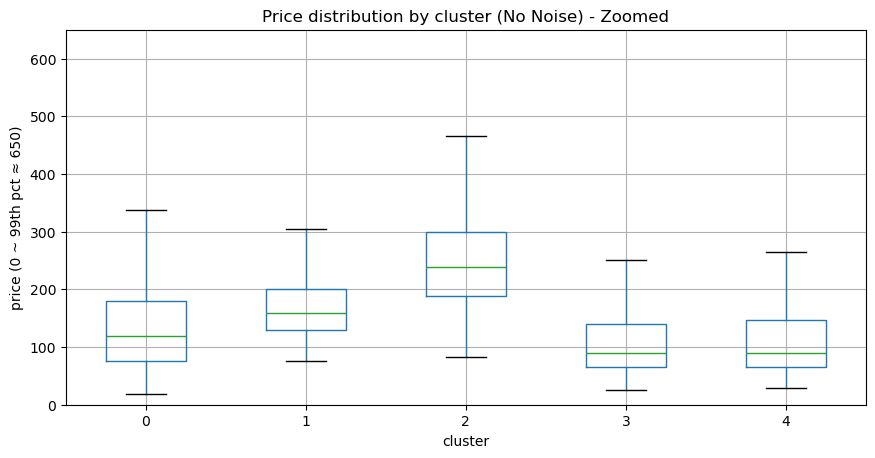

In [ ]:
upper = df_no_noise["price"].quantile(0.99)

ax = df_no_noise.boxplot(column="price", by="cluster", figsize=(10,5), showfliers=False)
ax.set_ylim(0, upper)      
ax.set_ylabel(f"price (0 ~ 99th pct ≈ {upper:.0f})")

plt.title("Price distribution by cluster (No Noise) - Zoomed")
plt.suptitle("")
plt.show()


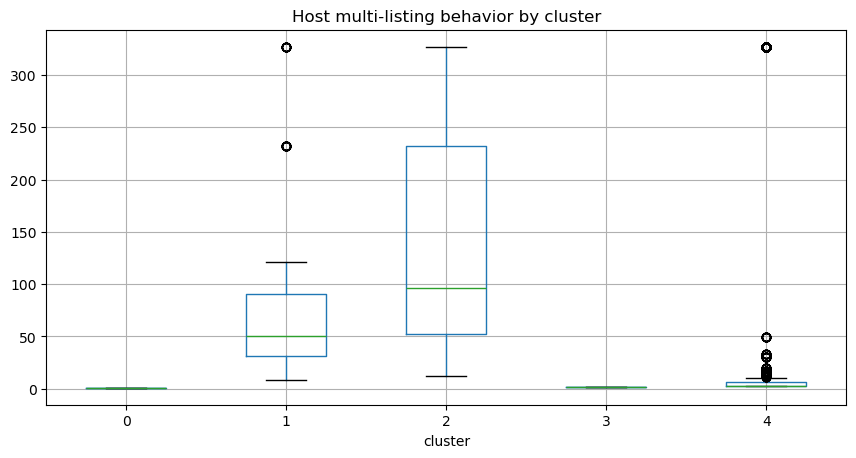

In [ ]:
df_no_noise.boxplot(column='calculated_host_listings_count', by='cluster', figsize=(10,5))
plt.title("Host multi-listing behavior by cluster")
plt.suptitle("")
plt.show()

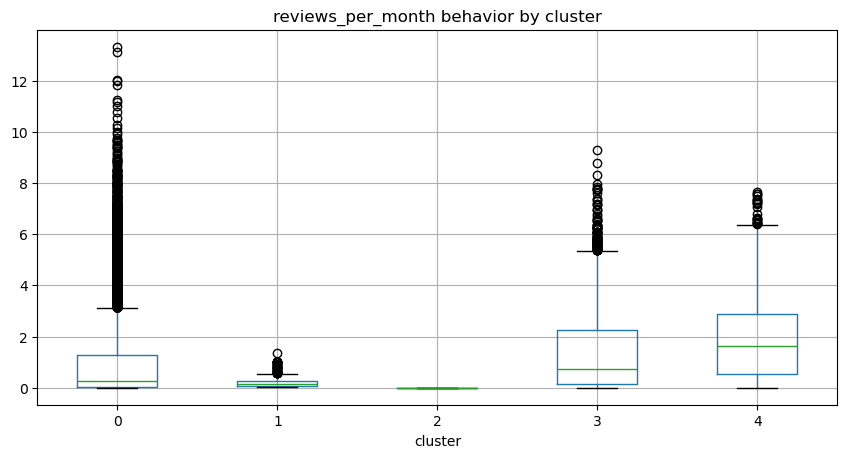

In [ ]:
df_no_noise.boxplot(column='reviews_per_month', by='cluster', figsize=(10,5))
plt.title("reviews_per_month behavior by cluster")
plt.suptitle("")
plt.show()

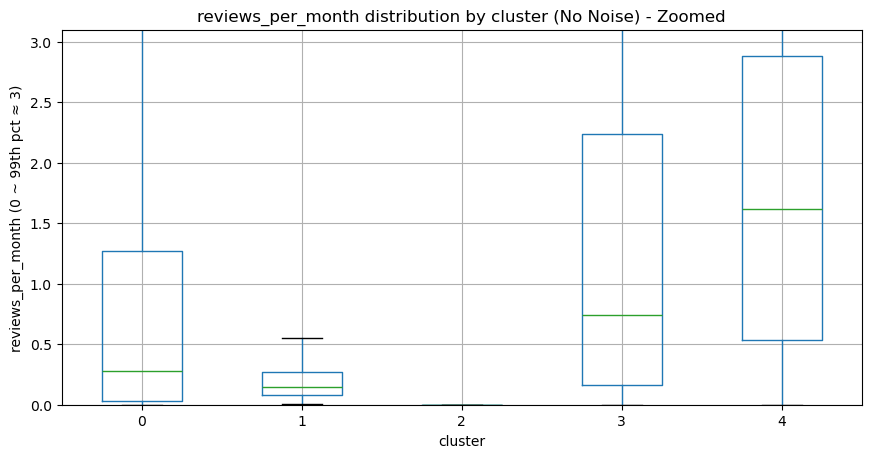

In [43]:

upper = df_no_noise["reviews_per_month"].quantile(0.9)

ax = df_no_noise.boxplot(column="reviews_per_month", by="cluster", figsize=(10,5), showfliers=False)
ax.set_ylim(0, upper)        
ax.set_ylabel(f"reviews_per_month (0 ~ 99th pct ≈ {upper:.0f})")

plt.title("reviews_per_month distribution by cluster (No Noise) - Zoomed")
plt.suptitle("")
plt.show()


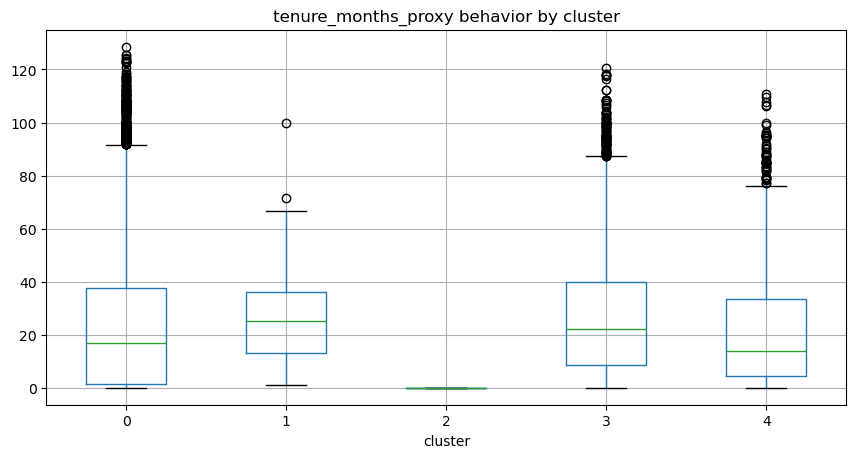

In [ ]:
df_no_noise.boxplot(column='tenure_months_proxy', by='cluster', figsize=(10,5))
plt.title("tenure_months_proxy behavior by cluster")
plt.suptitle("")
plt.show()

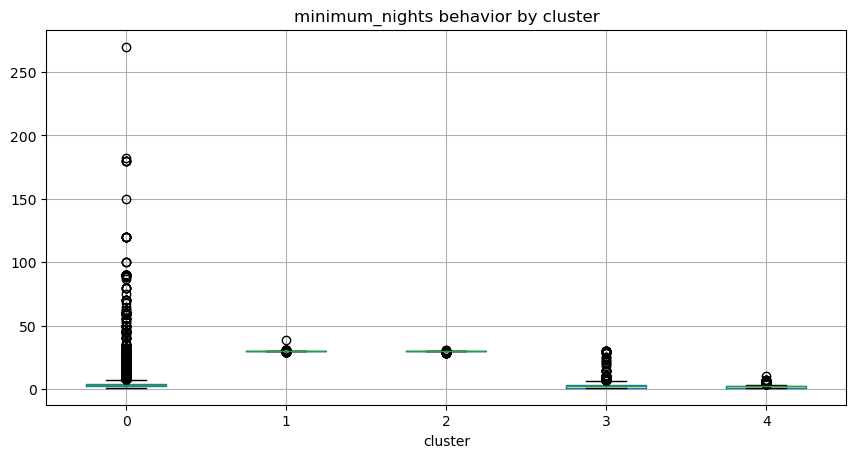

In [ ]:
df_no_noise.boxplot(column='minimum_nights', by='cluster', figsize=(10,5))
plt.title("minimum_nights behavior by cluster")
plt.suptitle("")
plt.show()

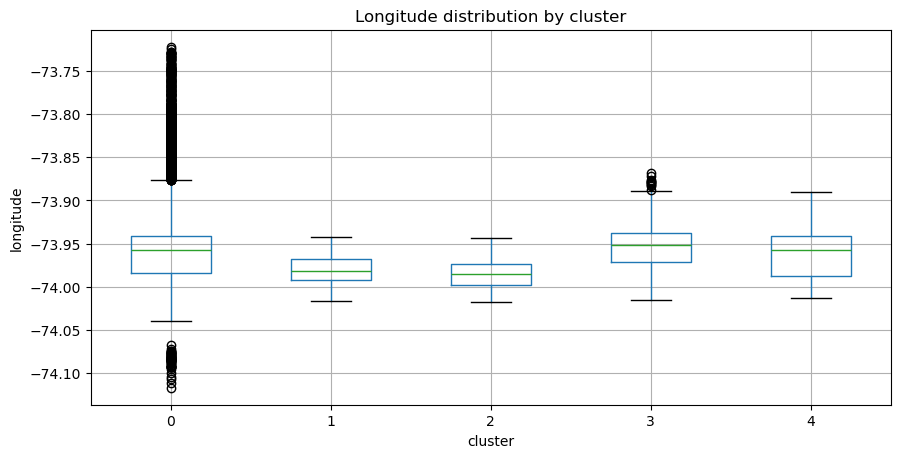

In [89]:
ax = df_no_noise.boxplot(
    column="longitude",
    by="cluster",
    figsize=(10,5)
)
ax.set_ylabel("longitude")
plt.title("Longitude distribution by cluster")
plt.suptitle("")
plt.show()

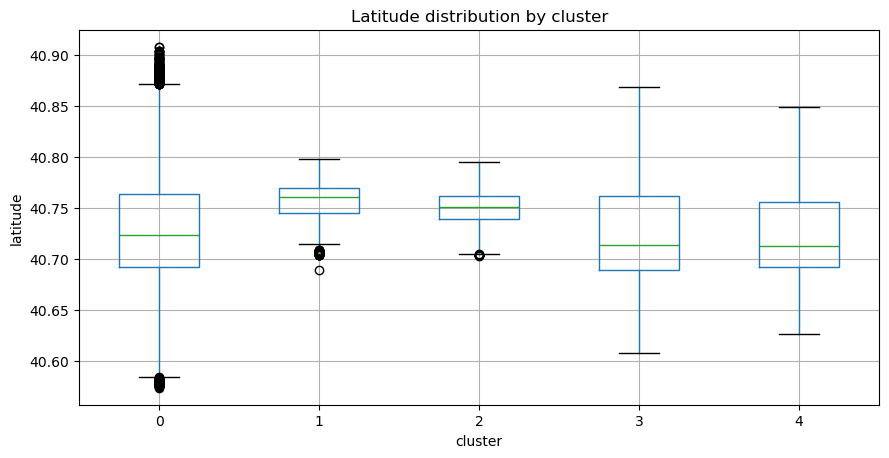

In [87]:
ax = df_no_noise.boxplot(
    column="latitude",
    by="cluster",
    figsize=(10,5)
)
ax.set_ylabel("latitude")
plt.title("Latitude distribution by cluster")
plt.suptitle("")
plt.show()

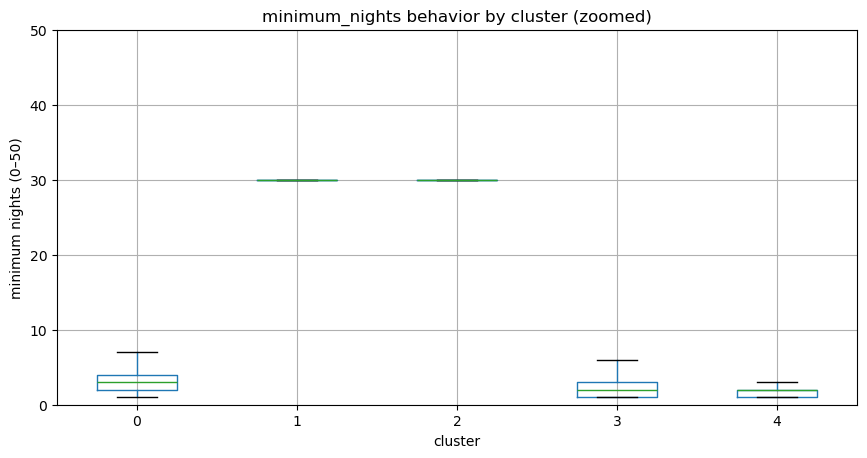

In [ ]:
ax = df_no_noise.boxplot(
    column="minimum_nights",
    by="cluster",
    figsize=(10,5),
    showfliers=False 
)

ax.set_ylim(0, 50) 
ax.set_ylabel("minimum nights (0–50)")
plt.title("minimum_nights behavior by cluster (zoomed)")
plt.suptitle("")
plt.show()

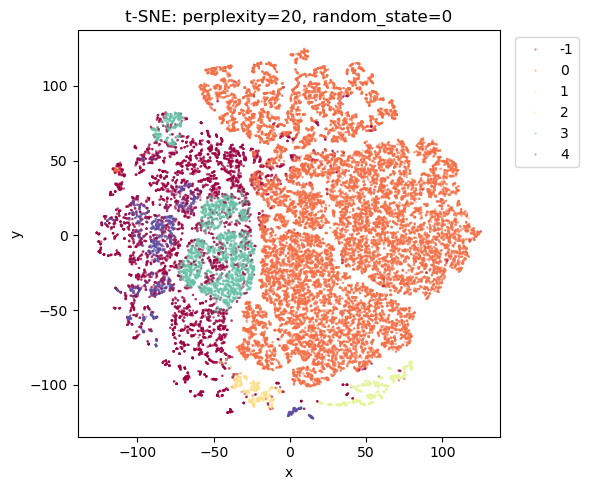

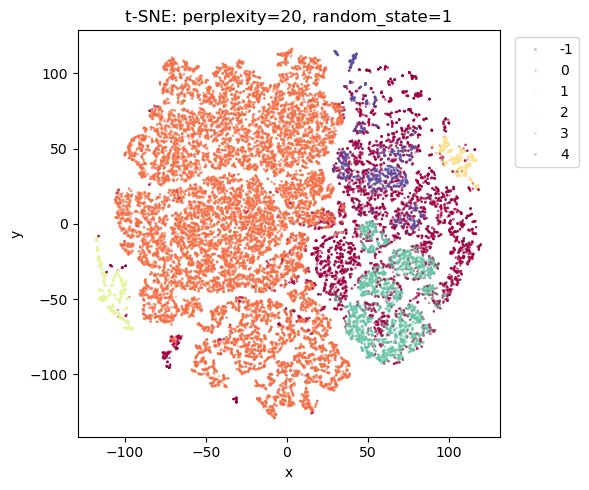

-------------------------------------------


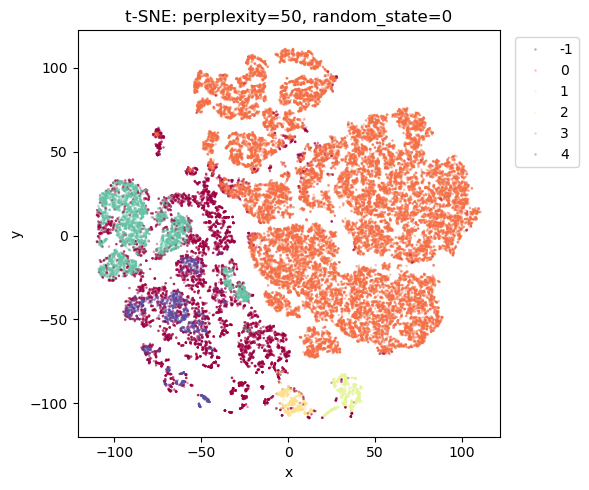

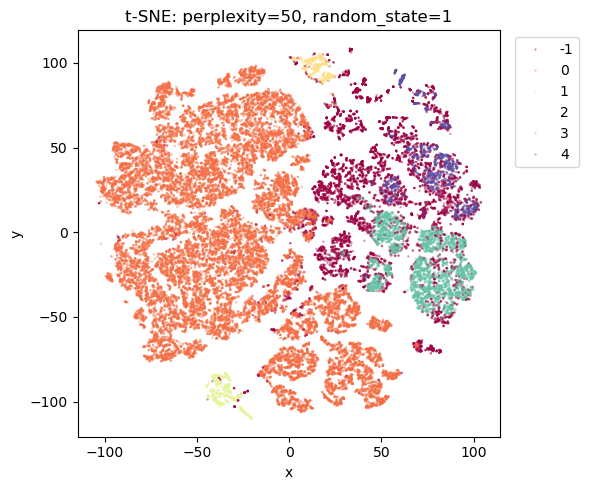

-------------------------------------------


In [ ]:
#t-SNE
from sklearn.manifold import TSNE
X_tsne = df_scaled_final.values

df_clusters = pd.DataFrame({'cluster': labels})

for perp in [20, 40, 50, 60, 80, 100]:
    for rs in [0,1]:

        tsne = TSNE(
            n_components=2,
            perplexity=perp,
            learning_rate='auto',
            init='random',
            random_state=rs,
        )

        data_tsne = tsne.fit_transform(X_tsne)

        df_tsne = pd.DataFrame(data_tsne, columns=['x', 'y'])
        df_combo = pd.concat([df_tsne, df_clusters], axis=1)

        plt.figure(figsize=(6, 5))
        sns.scatterplot(
            x='x', y='y',
            hue='cluster',
            data=df_combo,
            palette='Spectral',
            s=3,           
            alpha=0.4,     
            linewidth=0     
        )

        plt.title(f"t-SNE: perplexity={perp}, random_state={rs}")
        plt.legend(bbox_to_anchor=(1.02, 1), loc='upper left')
        plt.tight_layout()
        plt.show()

    print("-------------------------------------------")

HDBSACN-TSNE
Select a Representative t-SNE plot that displays similar patterns seen across many plots:
Perplexity = 50,
Random_state = 1

Describe the underlying Clustering Structure of the Dataset:
Is the dataset clusterable?
Yes. The t-SNE visualization shows clear grouping patterns in the low-dimensional embedding, with multiple dense regions separated by relatively sparse areas. This indicates that the dataset exhibits an inherent clustering structure rather than a uniform or continuous distribution.

Approximately how many underlying clusters does the data have?
The t-SNE plot suggests that the dataset contains approximately six underlying clusters.
These clusters appear as visually distinct regions in the embedding, including one large dominant cluster and several smaller, more compact clusters.

What are the shapes of the underlying clusters?
The underlying clusters exhibit irregular, non-spherical shapes.
Some clusters appear elongated or curved, while others are compact but non-circular. This suggests that the data does not satisfy the assumptions of spherical or convex cluster shapes, making density-based clustering approaches more appropriate than centroid-based methods such as k-means.

Are the clusters balanced in size?
No.
The clusters are highly imbalanced in size. One cluster contains a substantial proportion of the observations, while several other clusters are much smaller and more localized. This imbalance indicates heterogeneous data density across the feature space.

Are there any clusters that are not well separated?
Yes.
While most clusters are reasonably well separated, some smaller clusters partially overlap with neighboring clusters or are connected through transitional regions. This suggests the presence of soft boundaries between certain clusters rather than sharp separations.

Is there any evidence of nested cluster relationships?
Yes.
The t-SNE plot provides evidence of nested or hierarchical cluster structure, where smaller, denser sub-clusters appear embedded within or adjacent to larger clusters. This pattern is consistent with hierarchical density-based clustering behavior and suggests multi-scale structure in the data.


Clustering Structure and Attribute Association

To assess the association between individual attributes and the clustering structure, the t-SNE embedding was color-coded by each attribute in turn. Attributes that exhibit smooth gradients or consistent patterns within clusters demonstrate stronger association with the clustering structure, while attributes that vary randomly across clusters show weaker association.
Overall, several attributes display meaningful alignment with the t-SNE-suggested clusters, indicating that the clustering structure is not arbitrary but reflects systematic variation in the original feature space. Other attributes show weaker or no visible association, suggesting they contribute less to cluster separation.


Understanding the t-SNE Algorithm: Important Limitations

While t-SNE is useful for visualizing clustering structure, it does not reveal several important properties of the original dataset:
 1. Global distances are not preserved
Distances between far-apart clusters in the t-SNE plot do not represent true distances in the original feature space.
 2. Cluster sizes and densities are distorted
The apparent size or density of clusters in the t-SNE embedding does not accurately reflect their true size or density in the original data.
 3. The embedding is sensitive to hyperparameters and randomness
Different choices of perplexity or random initialization can lead to different visual layouts, even when the underlying cluster structure is similar.
 4. No direct interpretability of axes
The t-SNE axes do not correspond to interpretable linear combinations of the original variables, limiting its usefulness for direct feature interpretation.


In [ ]:

boroughs = gpd.read_file("https://raw.githubusercontent.com/dwillis/nyc-maps/master/boroughs.geojson")
boroughs

,BoroCode,BoroName,Shape_Leng,Shape_Area,geometry
0,5,Staten Island,330385.03697,1.623853e+09,"MULTIPOLYGON (((-74.05051 40.56642, -74.05047 ..."
1,4,Queens,861038.47930,3.049947e+09,"MULTIPOLYGON (((-73.83668 40.59495, -73.83678 ..."
2,3,Brooklyn,726568.94634,1.959432e+09,"MULTIPOLYGON (((-73.86706 40.58209, -73.86769 ..."
3,1,Manhattan,358532.95642,6.364422e+08,"MULTIPOLYGON (((-74.01093 40.68449, -74.01193 ..."
4,2,Bronx,464517.89055,1.186804e+09,"MULTIPOLYGON (((-73.89681 40.79581, -73.89694 ..."


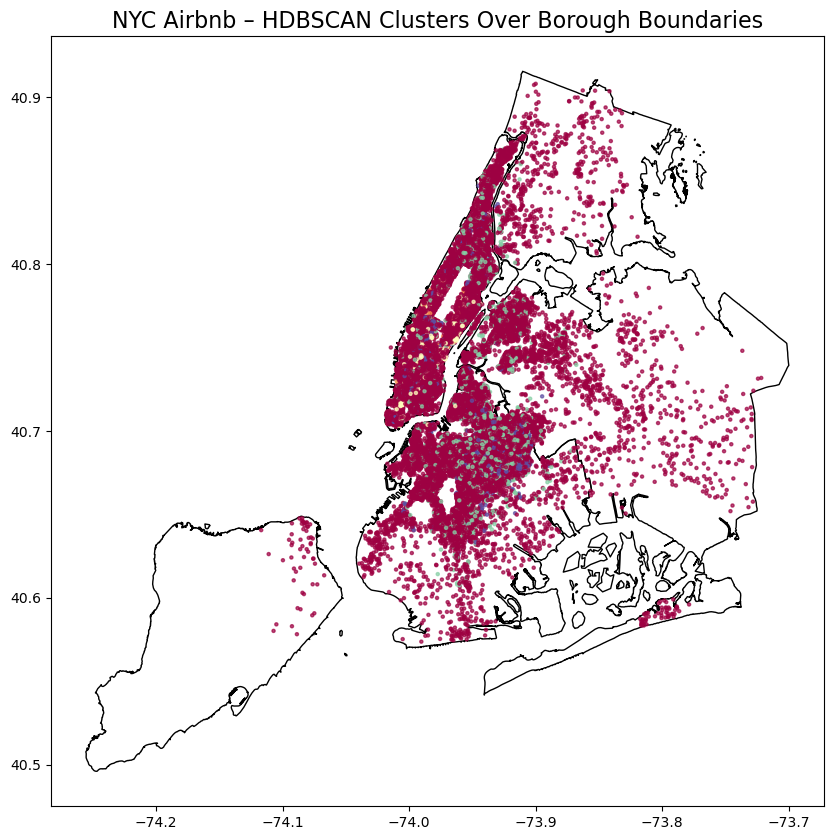

In [ ]:
fig, ax = plt.subplots(figsize=(10, 10))

boroughs.plot(ax=ax, edgecolor='black', facecolor='none', linewidth=1)

ax.scatter(
    df_no_noise['longitude'], 
    df_no_noise['latitude'], 
    c=df_no_noise['cluster'], 
    cmap='Spectral', 
    s=5, alpha=0.7
)

ax.set_title("NYC Airbnb – HDBSCAN Clusters Over Borough Boundaries", fontsize=16)
plt.show()

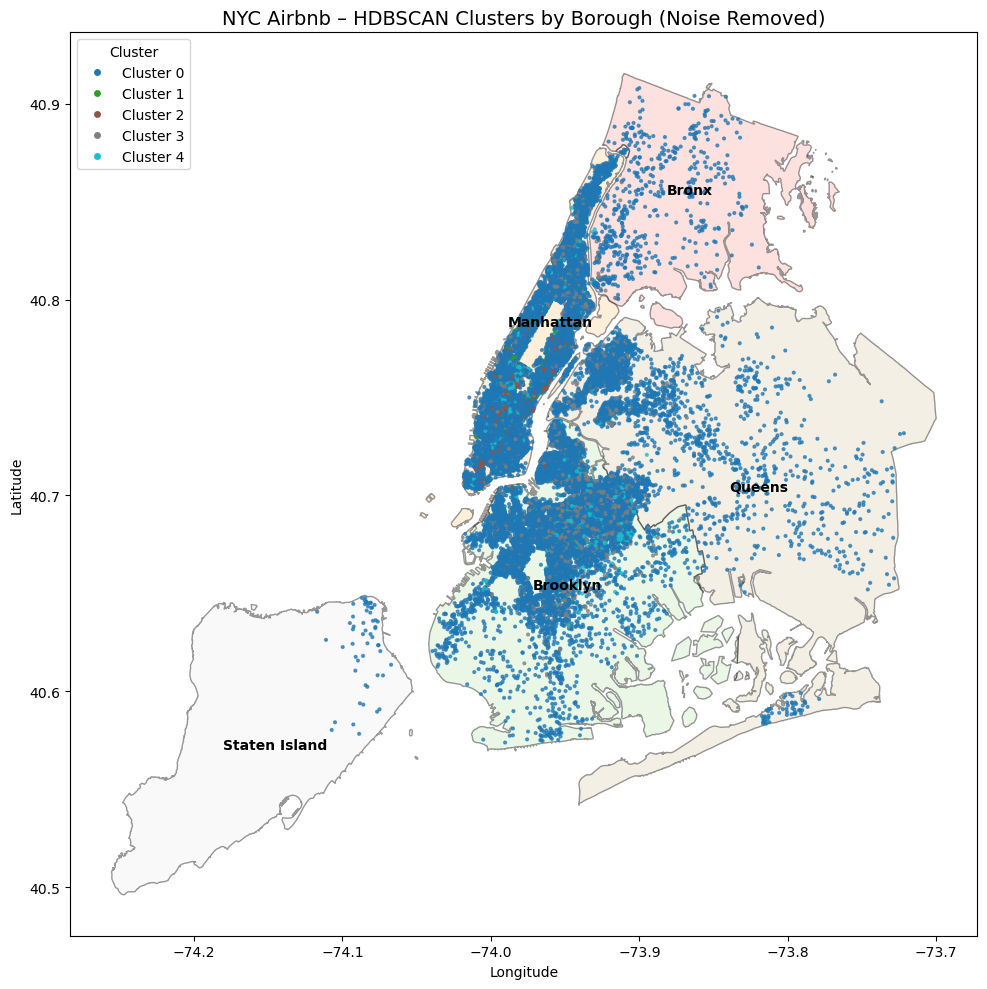

In [ ]:
fig, ax = plt.subplots(figsize=(10, 10))

name_col = 'boro_name' if 'boro_name' in boroughs.columns else 'BoroName'

boroughs.plot(
    ax=ax,
    column=name_col,
    cmap='Pastel1',
    edgecolor='black',
    alpha=0.4,
    legend=True,
    legend_kwds={'title': 'Borough'}
)

import matplotlib.colors as mcolors
unique_clusters = sorted(df_no_noise['cluster'].unique())
unique_clusters = [c for c in unique_clusters if c != -1]  

cmap = plt.get_cmap('tab10', len(unique_clusters))
color_list = cmap(range(len(unique_clusters)))
cluster_to_color = {c: color_list[i] for i, c in enumerate(unique_clusters)}

point_colors = df_no_noise['cluster'].map(cluster_to_color)

ax.scatter(
    df_no_noise['longitude'],
    df_no_noise['latitude'],
    c=point_colors,
    s=4,
    alpha=0.7
)

for _, row in boroughs.iterrows():
    pt = row.geometry.representative_point()
    ax.text(
        pt.x, pt.y, row[name_col],
        ha='center', va='center',
        fontsize=10, fontweight='bold'
    )

handles = [
    plt.Line2D([0], [0], marker='o', color='w',
               markerfacecolor=cluster_to_color[c], markersize=6,
               label=f"Cluster {c}")
    for c in unique_clusters
]
ax.legend(handles=handles, title="Cluster", loc='upper left')

ax.set_title("NYC Airbnb – HDBSCAN Clusters by Borough (Noise Removed)", fontsize=14)
ax.set_xlabel("Longitude")
ax.set_ylabel("Latitude")

plt.tight_layout()
plt.show()

/var/folders/4m/m7zs70mn0x57z_6k0gvp8ptc0000gn/T/ipykernel_20087/4239579308.py:6: FutureWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  .apply(lambda g: g.sample(n=min(len(g), k), random_state=42))


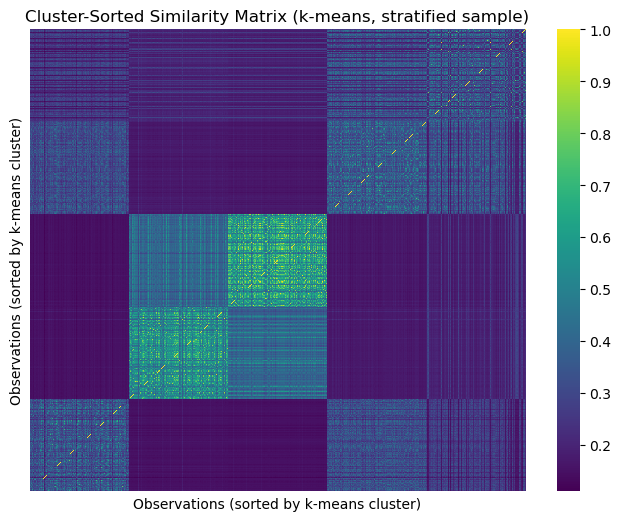

In [ ]:
# Cluster-Sorted Similarity Matrix
k = 300 
df_vis = (
    df_no_noise
    .groupby("cluster", group_keys=False)
    .apply(lambda g: g.sample(n=min(len(g), k), random_state=42))
)

X_clean = df_scaled_final.loc[df_vis.index].values
labels = df_vis["cluster"] 

D = pairwise_distances(X_clean, metric="euclidean")

S = 1 / (1 + D)

sort_idx = np.argsort(labels.values)
S_sorted = S[sort_idx][:, sort_idx]
labels_sorted = labels.iloc[sort_idx].values

plt.figure(figsize=(8, 6))
ax = sns.heatmap(
    S_sorted,
    cmap="viridis",
    cbar=True,
    xticklabels=False,
    yticklabels=False
)
ax.invert_yaxis()  

plt.title("Cluster-Sorted Similarity Matrix (k-means, stratified sample)")
plt.xlabel("Observations (sorted by k-means cluster)")
plt.ylabel("Observations (sorted by k-means cluster)")
plt.show()


In [ ]:
#Adjusted rand score 
labels_hdb = clusterer.labels_     
labels_km  = labels_km            


assert len(labels_hdb) == len(labels_km)


mask = labels_hdb != -1
ari_non_noise = adjusted_rand_score(labels_hdb[mask], labels_km[mask])
print(f"ARI (excluding HDBSCAN noise -1): {ari_non_noise:.4f}")
print(f"Non-noise points used: {mask.sum()} / {len(mask)}")


labels_hdb_all = labels_hdb.copy()
ari_all = adjusted_rand_score(labels_hdb_all, labels_km)
print(f"ARI (treat noise as its own label): {ari_all:.4f}")


ARI (excluding HDBSCAN noise -1): 0.0946
Non-noise points used: 39142 / 48381
ARI (treat noise as its own label): 0.1454


The low ARI (excluding HDBSCAN noise is 0.0946) confirms the key finding: K-means and HDBSCAN are capturing fundamentally different aspects of the market.

## 9.2 Dataset Clustering and Post-Clustering Analysis of Algorithm 3 (DBSCAN)

DBSCAN is a density-based clustering algorithm that defines clusters as contiguous regions of high point density and explicitly labels low-density observations as noise. Unlike k-means, DBSCAN does not require specifying the number of clusters in advance, making parameter selection a crucial part of the analysis. The two key parameters are eps (controlling the neighborhood radius) and min_samples (determining the minimum number of points required to form a dense region).

To guide the selection of eps, we constructed a k-distance graph with k=20, a value matching the chosen min_samples value. The sorted 20th nearest neighbor distance curve showed a relatively flat region followed by a sharp increase near the end of the curve. This "elbow point" indicates the transition from dense regions to sparse points. Based on this graph, we selected eps around 0.6 to balance capturing dense clusters and avoiding including too much noise.

We explored various parameter combinations by examining how different eps thresholds affected the number of clusters detected, the proportion of noise points, and the interpretability of the clusters. The chosen parameters yielded a moderate number of clusters while retaining a significant portion of the dataset as non-noise observations.

To visually assess the DBSCAN clustering structure in the reduced-dimensional space, we applied t-SNE to the scaled feature space and colored the points according to the DBSCAN cluster labels. We tested multiple perplexity values ​​(20, 40, 50, 60, 80, and 100) and random states to evaluate its stability. Under different t-SNE configurations, DBSCAN exhibited a consistent pattern: a main dense region corresponding to the largest cluster, and several smaller, separate clusters. Unlike k-means, the DBSCAN clusters were not uniformly compact in the t-SNE space. This behavior is reasonable, as DBSCAN prioritizes density connectivity over global variance minimization. The presence of isolated compact groups near the edges further supports this interpretation: DBSCAN is capturing local listing behaviors that may be associated with niche markets or specific geographic micro-regions.

Since DBSCAN is a hard clustering algorithm with explicit noise labeling, points assigned the label -1 are excluded from the cluster-based similarity analysis. After removing the noise points, there is significant heterogeneity in cluster sizes, with a few large clusters and many smaller ones. The scatter plot shows that DBSCAN clustering aligns well with the spatial structure. Many clusters correspond to geographically contiguous regions, especially in densely populated urban areas, suggesting that location plays a dominant role in density formation. This differs from k-means, where clusters typically span larger spatial ranges due to global centroid optimization.

Noise handling is a key advantage of DBSCAN in this dataset. A considerable portion of listings were labeled as noise, potentially corresponding to atypical combinations of price, availability, activity, or location. From a market segmentation perspective, treating these listings as noise rather than forcing them into clusters avoids distorting the structure of well-defined groups.

Box plots of numerical attributes, plotted according to DBSCAN clustering, reveal significant differences in listing behavior across different clusters. Price distributions vary considerably, with some clusters characterized by consistently higher prices, while others are concentrated at lower price levels. These differences remain significant even when zoomed in to the 99th percentile, indicating that price is a key distinguishing feature within dense regions. Significant differences also exist across clusters in terms of host behavior; calculated_host_listings_count (number of listings per host) shows that some clusters are primarily composed of hosts managing multiple listings, while others consist mainly of hosts with only one listing. Similarly, reviews_per_month and minimum_nights also exhibit cluster-specific patterns, indicating variations in listing activity and expected rental duration.

Box plots based on latitude confirm significant geographical stratification between clusters, consistent with the spatial clustering observed in the scatter plot. These attribute patterns suggest that the DBSCAN clusters correspond to market segments defined by location, price, and host professionalism.

The chosen DBSCAN configuration strongly demonstrates the inherent density-based structure present in the Airbnb listing data, particularly in identifying geographically concentrated clusters and isolating anomalous listings as noise. Compared to k-means, DBSCAN is more aligned with the research objective of understanding natural market segmentation without pre-specifying the number of clusters.

However, DBSCAN also has significant limitations. The results are sensitive to the choice of the eps parameter, and a single global density threshold may not optimally capture clusters with varying densities. This is reflected in the phenomenon of a large cluster coexisting with many smaller clusters, which may reflect density heterogeneity rather than true market imbalances. Furthermore, DBSCAN does not provide soft cluster membership or probabilistic assignments, which limits nuanced interpretations of areas near cluster boundaries.



## Clustering Algorithm #3: DBSCAN

We selected DBSCAN as our third clustering algorithm to complement HDBSCAN and provide a different density-based perspective. While DBSCAN is more restrictive than HDBSCAN, it still serves as a useful benchmark to help us understand the robustness of density-driven clustering structures in our data. First, DBSCAN is designed to identify clusters as high-density connected regions, which aligns with our research motivation of detecting groups of Airbnb listings with high concentrations of geographical location and behavioral characteristics. In areas where listings are tightly clustered in both spatial and behavioral dimensions, DBSCAN can effectively identify coherent clusters. Second, like HDBSCAN, DBSCAN explicitly labels noise points, making it well-suited for datasets containing outliers or isolated observations. This feature is advantageous given our prior identification of multivariate noise, and superior to algorithms that force every data point into a cluster regardless of whether it fits. Finally, DBSCAN does not require pre-specifying the number of clusters, which is highly beneficial in exploratory research where the actual number of clusters is unknown. Instead, clustering behavior is controlled by interpretable parameters related to neighborhood size and density. This aligns with our emphasis on discovering underlying structures rather than imposing an arbitrary number of clusters. However, DBSCAN's underlying assumption of a single global density threshold reduces its flexibility when cluster densities vary significantly. For this reason, DBSCAN is used as a complementary method to HDBSCAN, rather than a replacement, allowing us to compare the results of density-based clustering methods based on different assumptions.


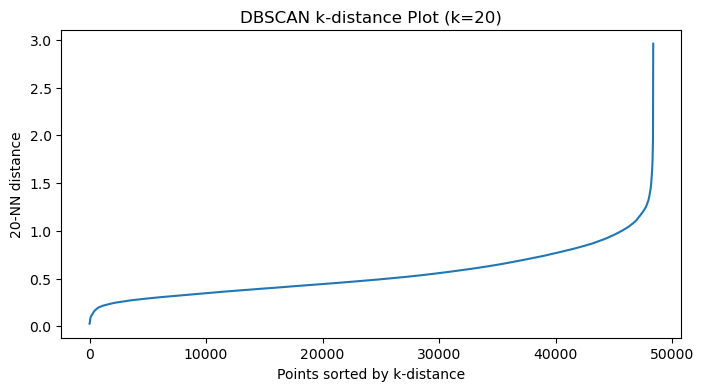

In [ ]:
# Kehuan
# DBSCAN - k-distance plot (eps selection aid)

X = df_scaled_final.values

min_samples = 20
k_neighbors = min_samples

nn = NearestNeighbors(n_neighbors=k_neighbors)
nn.fit(X)
distances, _ = nn.kneighbors(X)

kth_distances = np.sort(distances[:, -1])

plt.figure(figsize=(8,4))
plt.plot(kth_distances)
plt.title(f"DBSCAN k-distance Plot (k={k_neighbors})")
plt.xlabel("Points sorted by k-distance")
plt.ylabel(f"{k_neighbors}-NN distance")
plt.show()


In [ ]:
# DBSCAN

X = df_scaled_final.values

dbscan = DBSCAN(
    eps=0.6,
    min_samples=20,
    metric='euclidean'
)

dbscan.fit(X)

labels = dbscan.labels_

labels[:10], len(set(labels))


(array([-1,  1,  0,  0,  0,  0,  0,  0,  0, -1]), 31)

In [55]:

cluster_counts = pd.Series(labels).value_counts().sort_index()
cluster_counts

df_result = df_raw_final.copy()
df_result['cluster'] = labels


In [56]:

#data-no noise
df_no_noise = df_result[df_result['cluster'] != -1]
df_no_noise.describe()


,latitude,longitude,price,minimum_nights,reviews_per_month,calculated_host_listings_count,tenure_months_proxy,cluster
count,38431.000000,38431.000000,38431.000000,38431.000000,38431.000000,38431.000000,38431.000000,38431.000000
mean,40.730884,-73.959993,144.766517,5.400952,0.975605,7.860946,22.876904,1.105045
std,0.049087,0.028820,115.442931,8.061287,1.426843,36.652405,23.022433,3.449675
min,40.575090,-74.089070,18.000000,1.000000,0.000000,1.000000,0.000000,0.000000
25%,40.693380,-73.984060,75.000000,2.000000,0.030000,1.000000,1.565777,0.000000
50%,40.724030,-73.958390,115.000000,3.000000,0.300000,1.000000,17.005076,0.000000
75%,40.763165,-73.941840,180.000000,5.000000,1.360000,1.000000,37.500000,0.000000
max,40.907340,-73.811720,2750.000000,75.000000,16.220000,327.000000,128.571429,29.000000


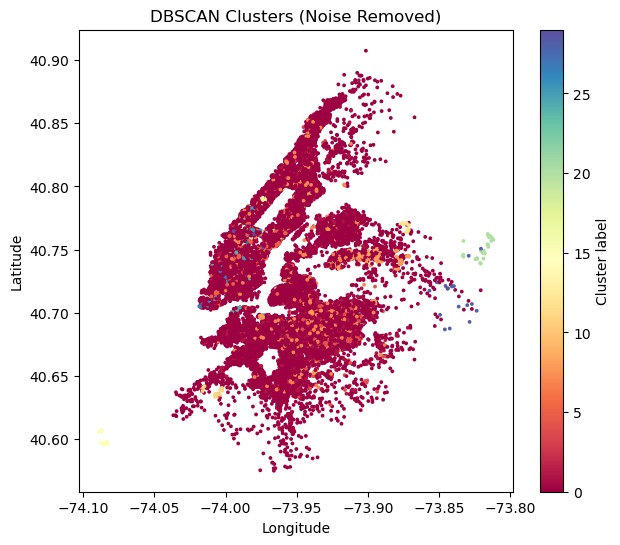

In [57]:
df_no_noise = df_result[df_result['cluster'] != -1]

plt.figure(figsize=(7,6))
plt.scatter(df_no_noise['longitude'], df_no_noise['latitude'],
            c=df_no_noise['cluster'], cmap='Spectral', s=3)
plt.colorbar(label='Cluster label')
plt.title("DBSCAN Clusters (Noise Removed)")
plt.xlabel("Longitude")
plt.ylabel("Latitude")
plt.show()


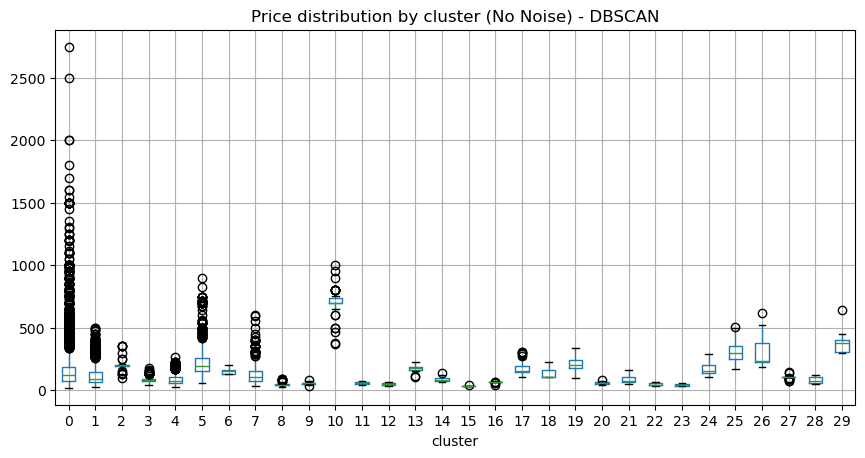

In [58]:

#Statistical Summary - price
df_no_noise.boxplot(column='price', by='cluster', figsize=(10,5))
plt.title("Price distribution by cluster (No Noise) - DBSCAN")
plt.suptitle("")
plt.show()


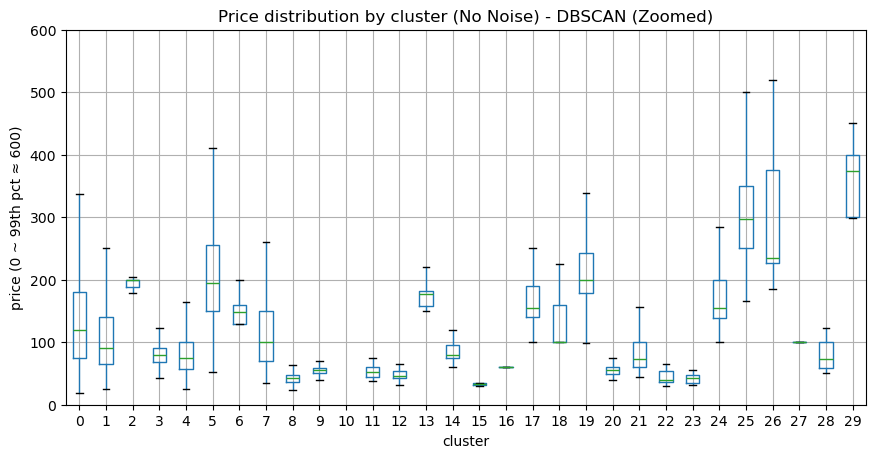

In [ ]:


upper = df_no_noise["price"].quantile(0.99)

ax = df_no_noise.boxplot(column="price", by="cluster", figsize=(10,5), showfliers=False)
ax.set_ylim(0, upper)
ax.set_ylabel(f"price (0 ~ 99th pct ≈ {upper:.0f})")

plt.title("Price distribution by cluster (No Noise) - DBSCAN (Zoomed)")
plt.suptitle("")
plt.show()


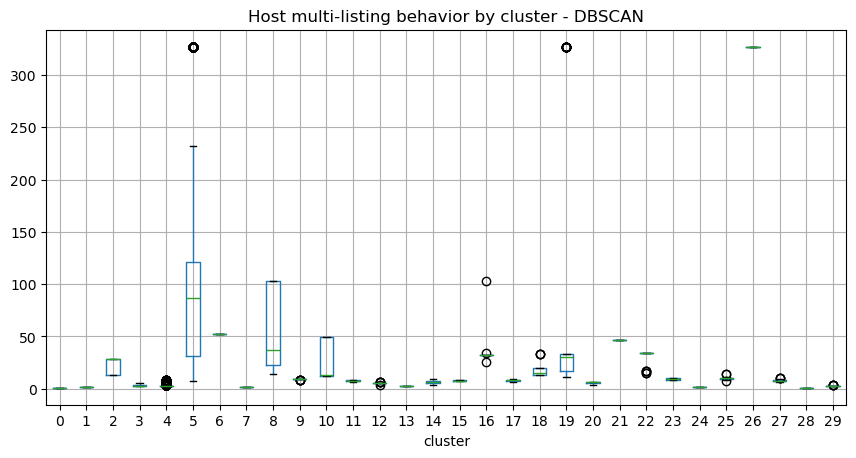

In [60]:
df_no_noise.boxplot(column='calculated_host_listings_count', by='cluster', figsize=(10,5))
plt.title("Host multi-listing behavior by cluster - DBSCAN")
plt.suptitle("")
plt.show()


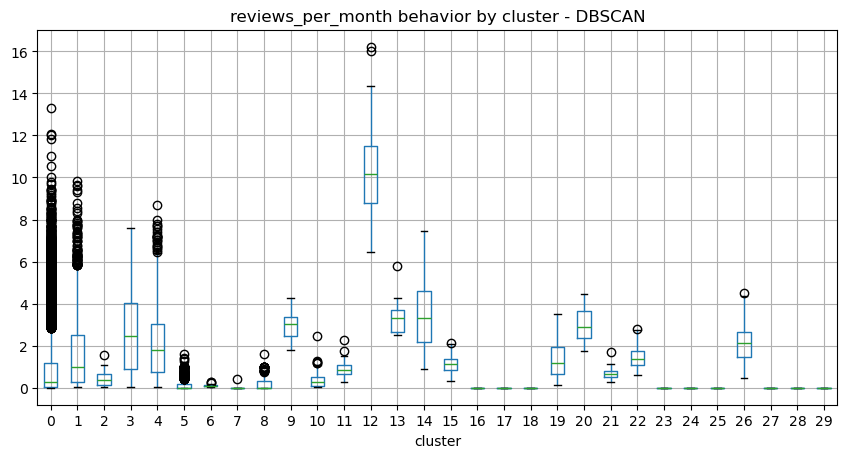

In [61]:
df_no_noise.boxplot(column='reviews_per_month', by='cluster', figsize=(10,5))
plt.title("reviews_per_month behavior by cluster - DBSCAN")
plt.suptitle("")
plt.show()


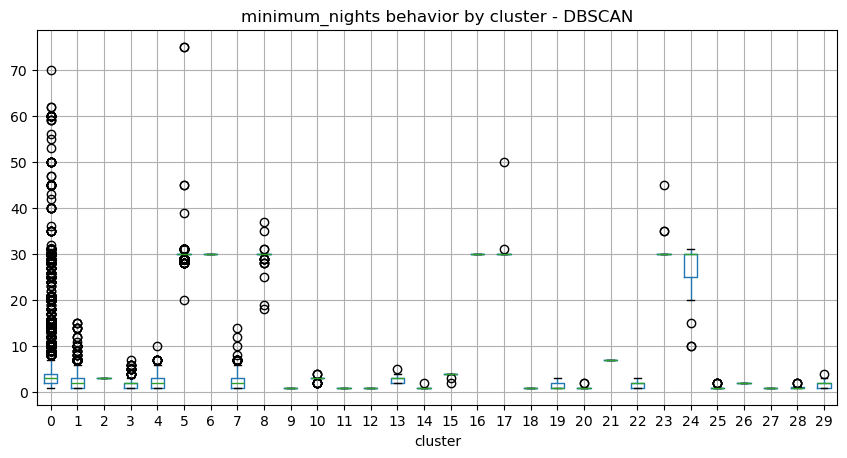

In [62]:
df_no_noise.boxplot(column='minimum_nights', by='cluster', figsize=(10,5))
plt.title("minimum_nights behavior by cluster - DBSCAN")
plt.suptitle("")
plt.show()


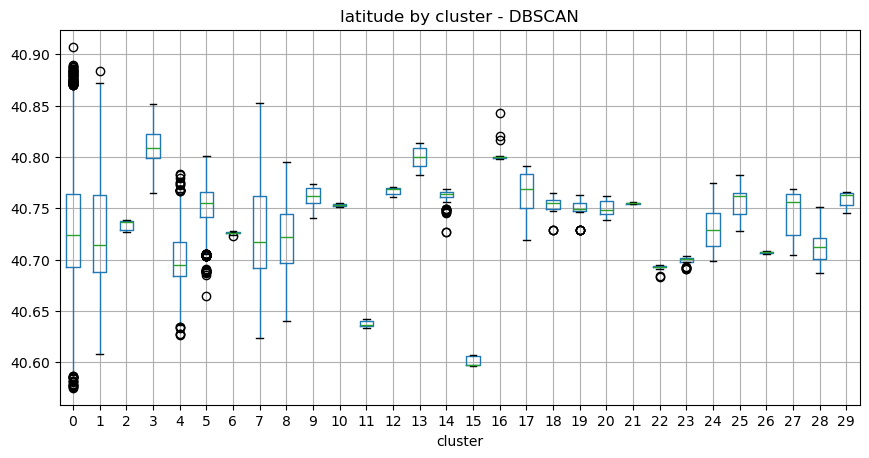

In [63]:
df_no_noise.boxplot(column='latitude', by='cluster', figsize=(10,5))
plt.title("latitude by cluster - DBSCAN")
plt.suptitle("")
plt.show()


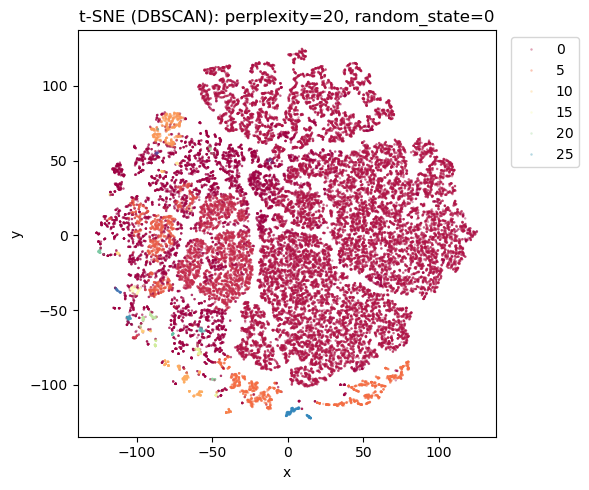

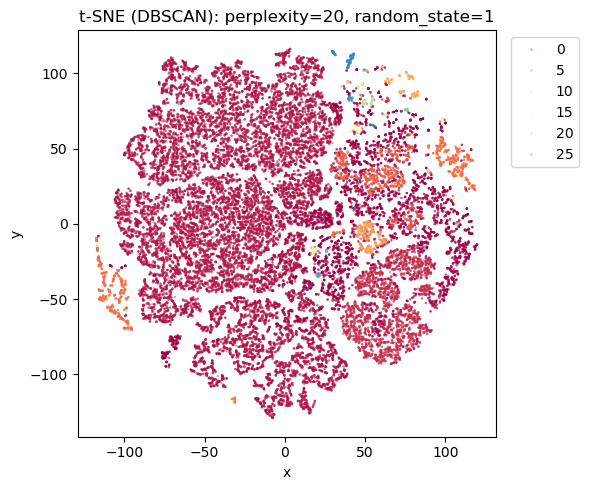

-------------------------------------------


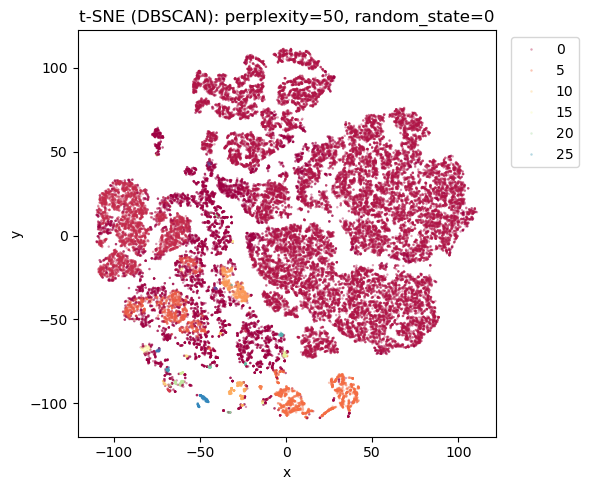

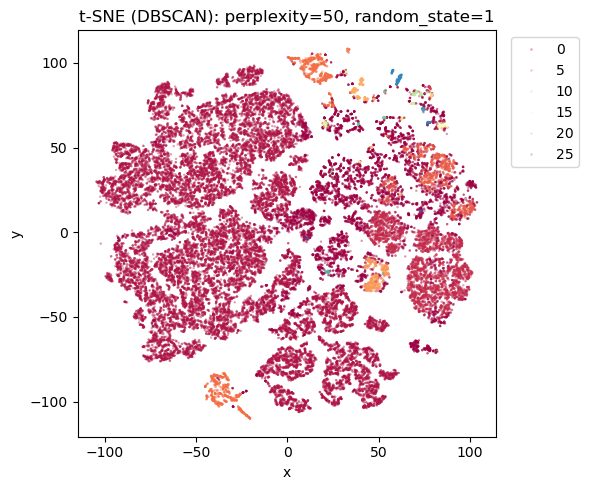

-------------------------------------------


In [ ]:
#t-SNE (DBSCAN)

from sklearn.manifold import TSNE

X_tsne = df_scaled_final.values
df_clusters = pd.DataFrame({'cluster': labels})

for perp in [[20, 40, 50, 60, 80, 100]  :
    for rs in [0,1]:

        tsne = TSNE(
            n_components=2,
            perplexity=perp,
            learning_rate='auto',
            init='random',
            random_state=rs,
        )

        data_tsne = tsne.fit_transform(X_tsne)

        df_tsne = pd.DataFrame(data_tsne, columns=['x', 'y'])
        df_combo = pd.concat([df_tsne, df_clusters], axis=1)

        plt.figure(figsize=(6, 5))
        sns.scatterplot(
            x='x', y='y',
            hue='cluster',
            data=df_combo,
            palette='Spectral',
            s=3,
            alpha=0.4,
            linewidth=0
        )

        plt.title(f"t-SNE (DBSCAN): perplexity={perp}, random_state={rs}")
        plt.legend(bbox_to_anchor=(1.02, 1), loc='upper left')
        plt.tight_layout()
        plt.show()

    print("-------------------------------------------")

In [ ]:

# DBSCAN is a hard clustering algorithm:
# each point is either assigned to a single cluster or labeled as noise (-1).
# It does not provide membership probabilities, so fuzziness analysis is not applicable.

## 10. Discussion

Clustering Comparison: What Was Different?
(5 differences)
1. Ability to Handle Noise and Outliers
- K-means forces all observations into clusters, even clearly isolated or low-density points.
- DBSCAN labels a large portion of the dataset as noise, indicating an overly conservative clustering on this data.
- HDBSCAN achieves a balance by identifying meaningful clusters while labeling only unstable points as noise.

2. Stability and Interpretability of Clusters
- K-means produces clusters of similar size but lacks stability due to sensitivity to the chosen k.
- DBSCAN yields only a few dense clusters, missing finer structure.
- HDBSCAN identifies multiple stable clusters supported by persistence in the hierarchy.

3. Similarity Matrix Structure
- K-means shows only an approximate block structure, suggesting weak separation.
- DBSCAN exhibits fragmented and less coherent blocks.
3)HDBSCAN displays the clearest block-diagonal pattern, indicating strong within-cluster similarity and good separation.

4. Sensitivity to Parameter Choices
- K-means requires careful tuning of k, with different values leading to noticeably different partitions.
- DBSCAN is highly sensitive to epsilon, resulting in drastic changes in noise proportion.
- HDBSCAN is more robust, with stable results across reasonable parameter settings and Adaptive minpts and epsilon.

5. Faithfulness to Underlying Data Structure
- K-means assumes homogeneous, spherical clusters, which conflicts with observed patterns.
- DBSCAN assumes a single density scale, which is too restrictive for this dataset.
- HDBSCAN accommodates varying densities and hierarchical relationships, aligning best with the observed/densed structure.

Across noise handling, stability, similarity structure, parameter robustness, and alignment with the intrinsic data geometry, HDBSCAN consistently outperforms K-means and DBSCAN on this dataset.



“Best” Clustering(s)
Among all the clustering results explored, HDBSCAN provided the strongest evidence for identifying inherent clusters in the dataset. Its ability to detect clusters of varying densities, explicitly assign noise points, and provide membership probabilities made it the most informative and best aligned with our research objectives. In contrast, DBSCAN only captured the densest structures and was less effective in revealing finer-grained market segments. K-means was most affected by irregular clusters, unclear boundaries, and a large amount of noise.


Different Clustering Insights
Taken together, the three clustering methods provide complementary perspectives on the structure of the dataset. K-means emphasizes global partitioning by dividing the data into a fixed number of balanced clusters. This highlights broad, coarse-grained patterns driven by dominant features, but at the cost of smoothing over local heterogeneity and forcing all observations into clusters, including those that do not naturally belong to any meaningful group.
DBSCAN offers a contrasting, conservative view by focusing on the densest regions of the data. It effectively identifies core clusters and explicitly labels outliers as noise, which is useful for isolating the most well-defined and extreme groups.However, its reliance on a single global density scale limits its ability to capture clusters of varying density, often resulting in large portions of the data being treated as noise.
HDBSCAN integrates and extends these perspectives by adapting to local density variations through a hierarchical framework. It reveals multiple stable clusters across different density levels while appropriately identifying noise and borderline observations. As a result, HDBSCAN uncovers fine-grained substructure that is obscured by K-means and overlooked by DBSCAN, providing the most comprehensive and faithful representation of the dataset’s underlying organization.


Additional "Best" Clustering(s) Exploration
Using a similarity matrix ordered based on the optimal HDBSCAN clustering results, we observed a clear block diagonal pattern, corresponding to consistent clusters. Some clusters were far apart from each other, indicating significant separation, while a few clusters were closer together in the similarity space, suggesting they represent related market segments. Noise points did not form consistent blocks, further confirming their classification as outlier observations. In terms of sparsity, some clusters were significantly denser than others, reflecting differences in market concentration across different listing types. High-density clusters tended to correspond to geographically concentrated and highly active listings, while sparse clusters reflected information from more dispersed or less concentrated listings.


Additional "Best" Clustering(s) Attribute Descriptions
The final HDBSCAN clustering revealed distinct and interpretable market segments: one cluster is characterized by high prices, long minimum stay durations, and less review activity, consistent with high-end or long-term rental properties. Another cluster exhibits lower prices, short minimum stay durations, and high review frequency, reflecting an active short-term rental market. A third cluster is associated with hosts managing multiple properties, indicating commercialized landlord behavior. Other clusters represent geographically distinct groups with moderate pricing and activity levels, representing localized community markets. These differences in attributes are strongly supported by box plots, which show limited overlap between clusters across multiple attributes.


## 11. Conclusion

Summarize

In this report, we conducted a comprehensive clustering analysis of Airbnb short-term rental listings in New York City to uncover intrinsic market structure without relying on predefined labels. After cleaning and preprocessing the dataset, we explored its characteristics through descriptive analysis and dimensionality reduction, followed by clustering analyses using multiple unsupervised learning approaches.
Across all methods, the results consistently indicate that the Airbnb market is highly heterogeneous, with listings differing substantially in pricing, geographic location, host behavior, and activity levels. A global partitioning approach such as K-means provides a useful high-level overview of this heterogeneity by grouping listings into broad, balanced segments that reflect dominant trends in the data. This perspective helps summarize large-scale structure but does not fully capture local variation.
Density-based methods offer additional insight into this complexity. DBSCAN highlights the most densely populated and well-defined regions of the market while identifying atypical listings as noise, offering a conservative view focused on core structures. Building on this, HDBSCAN reveals a richer and more nuanced organization of the data by identifying multiple stable clusters across varying density levels while appropriately modeling noise and borderline observations.

Taken together, these results suggest that while global partitioning methods are useful for summarizing overall structure, adaptive density-based clustering provides a more informative and interpretable representation of the underlying Airbnb market segmentation.

<br>

Recommendation

Based on these findings, we recommend that stakeholders such as housing analysts, urban planners, and Airbnb hosts utilize the data analysis results extracted from this analysis. For example, policymakers can use the cluster levels to identify neighborhoods dominated by professional short-term rental businesses and assess their impact on housing supply. Commercial landlords can compare their listings to others within the same cluster to adjust pricing strategies, minimum stay requirements, or rental methods. This data is most effective when applied at the cluster level rather than the individual listing level, as it highlights systemic patterns rather than individual independent behaviors. Because HDBSCAN explicitly distinguishes noise and low-confidence assignments, decision-makers can focus on well-defined market segments while addressing atypical listings separately.

<br>


Shortcomings/Caveats

Firstly, this dataset represents a snapshot of Airbnb listings in 2019 and may not reflect current market conditions or temporal dynamics. Secondly, the clustering results depend on the chosen features and preprocessing decisions; different variable selections may lead to different segmentation results. Furthermore, while density-based methods can effectively handle noise, they can still be sensitive to parameter selection, especially in density boundary regions where dense bridges might occur.

<br>


Future Work

This analysis can be extended in several ways in the future. Incorporating temporal information, such as how review activity changes over time, could reveal dynamic market evolution. Including categorical variables using appropriate encoding strategies, such as room type or neighborhood grouping, could further refine the interpretation of the clustering results. Furthermore, comparing density-based methods with other methods, such as Gaussian mixture models or hierarchical clustering using different distance metrics, could provide a deeper analysis of the robustness of the identified clusters.



### Additional Business Insights: 
(By Jiaxin)

We find that the HDBSCAN clustering results possess superior business guidance value, providing a more accurate segmentation of properties based on distinct business models, which facilitates optimized, granular operational management for hosts and platforms. 

The HDBSCAN output clearly separates the market: Clusters 1 and 2 are defined as listings run by large-scale institutional hosts or real estate agencies. These entities manage 50 to 100 listings per ID, concentrating their inventory in core urban areas like downtown Manhattan, with a strict minimum stay of one month. Cluster 1 represents established inventory (average tenure over two years) and Cluster 2 represents recent additions. In contrast, Clusters 3 and 4 feature properties managed by small, individual hosts, who typically operate fewer than two units. These listings are dispersed across the city and allow for short stays (under one week). Their significantly lower average nightly rate (sub-$100 vs. institutional rates exceeding $180) suggests a distinct cost structure, likely reflecting lower operational and vacancy costs. Cluster 3 is characterized by stable, mature listings (> 2 years online), while Cluster 4 stands out as high-engagement, "influencer" listings, with robust user review activity despite a shorter average online duration of approximately 1.5 years. 

Business suggestion: The precision of the HDBSCAN clustering allows Airbnb to formulate distinct and clear operational strategies. For the identified high-quality individual hosts in Clusters 3 and 4, the platform should prioritize incentive programs and supply expansion. Based on their high satisfaction ratings or active engagement, these listings should receive boosted traffic exposure through search ranking and recommendation algorithms. This not only rewards excellent service but also ensures the continued vitality of the platform’s traditional short-term rental business. Furthermore, Airbnb should leverage the success of these small hosts as models, designing and promoting a Host Referral Program to encourage them to onboard new hosts with similar operational characteristics. This move would organically and efficiently expand the supply of high-quality, decentralized listings while maintaining the brand’s community-centric, personalized identity. Conversely, the strategy for Clusters 1 and 2, which represent large institutional operators and property agencies, should center on commercial boundary expansion and standardization. The platform ought to view collaboration with these entities as an upgrade to its existing business model. This deep partnership with major property management platforms allows Airbnb to significantly enrich its long-term product matrix, providing guests needing longer stays (for work, study, or transition periods) with stable and reliable choices. This move not only enhances property standardization but also effectively expands the platform’s business scope, allowing it to penetrate the broader residential rental market.

By comparison, the K-means results, though exhibiting more uniform cluster sizes, are heavily location-dependent, resulting in less actionable business insight.

